# Credit Card Default Probability Prediction- with Machine Learning and Deep Learning in Databricks (with PySpark)

## Introduction
In this project I attempted to predict the default probability for clients in a retail portolio with Dataricks in a PySpark environment. I read the input data from an S3 bucket in my AWS account and wrote some of the outputs to the same location in S3. I employed several Machine Learning techniques (and Deep Learning) to see which model has the best AUROC. I used additional feature engineering techniques such as univariate outlier detection together with winsorizing, normalisation (scaling), PCA for dimensionality reduction and the Yeo-Johnson transform. Due to the high correlation of the billing amount variables between each-other at diferent points in time (autocorrelation), I decided to use PCA to de-correlate them.

The last step after creating the final training and test datasets was to develop several default probability prediction models (Machine Learning and Deep Learning models), tune them and assess their discriminative power and compare them in a horse race. I also visualised the Shapley values of the Gradient Booster Classifier and the Extreme Gradient Booster Classifier in order to analyse how each of the variables affects the probability that the client defaults next month.

## Overview¶
1. Data Exploration and Pre-processing
2. Feature Engineering and Train-Test Split 
3. Model Building (Baseline Test Performance)¶
4. Hyperparameter Tuning (Tuned Model Performance)
5. Conclusion

##Data
This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005.

The dataset (from UCI) used contains the following variables:

* ID: client ID (primary key)
* LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
* SEX: Gender (1=male, 2=female)
* EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
* MARRIAGE: Marital status (1=married, 2=single, 3=others)
* AGE: Age in years
* PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, ... 8=payment delay for eight months, 9=payment delay for nine months and above)
* PAY_2: Repayment status in August, 2005 (scale same as above)
* PAY_3:  Repayment status in July, 2005 (scale same as above)
* PAY_4:  Repayment status in June, 2005 (scale same as above)
* PAY_5:  Repayment status in May, 2005 (scale same as above)
* PAY_6:  Repayment status in April, 2005 (scale same as above)
* BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
* BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
* BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
* BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
* BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
* BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
* PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
* PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
* PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
* PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
* PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
* PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
* default.payment.next.month: Default payment (1=yes, 0=no)

## Acknowledgements
Any publications based on this dataset should acknowledge the following:

Lichman, M. (2013). UCI Machine Learning Repository [http://archive.ics.uci.edu/ml]. Irvine, CA: University of California, School of Information and Computer Science.

The original dataset can be found [here](https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients) at the UCI Machine Learning Repository.

## Data Exploration and Pre-Processing

###Reading the data from the S3 bucket (AWS)

In [0]:
ENCODED_SECRET_KEY = SECRET_KEY.replace("/", "%2F")
AWS_BUCKET_NAME = "databricks-workspace-stack-lambdazipsbucket-1cg83ucq5fbw1"
MOUNT_NAME = "databricks-workspace_credit_card_data"

dbutils.fs.mount(f"s3a://{ACCESS_KEY}:{ENCODED_SECRET_KEY}@{AWS_BUCKET_NAME}",f"/mnt/{MOUNT_NAME}")

In [0]:
%fs mounts

mountPoint,source,encryptionType
/databricks-datasets,databricks-datasets,sse-s3
/mnt/databricks-workspace_credit_card_data,s3a://databricks-workspace-stack-lambdazipsbucket-1cg83ucq5fbw1,
/databricks/mlflow-tracking,databricks/mlflow-tracking,sse-s3
/databricks-results,databricks-results,sse-s3
/databricks/mlflow-registry,databricks/mlflow-registry,sse-s3
/mnt/databricks-uc,s3a://databricks-workspace-stack-lambdazipsbucket-1cg83ucq5fbw1,
/,DatabricksRoot,sse-s3


In [0]:
data=(spark.read.option("sep",",").option("header",True).option("inferschema",True).csv(f"/mnt/{MOUNT_NAME}/UCI_Credit_Card.csv"))

### Exploring and pre-processing the data

In [0]:
display(data)

ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
1,20000.0,2,2,1,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
2,120000.0,2,2,2,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
3,90000.0,2,2,2,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
4,50000.0,2,2,1,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
5,50000.0,1,2,1,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
6,50000.0,1,1,2,37,0,0,0,0,0,0,64400.0,57069.0,57608.0,19394.0,19619.0,20024.0,2500.0,1815.0,657.0,1000.0,1000.0,800.0,0
7,500000.0,1,1,2,29,0,0,0,0,0,0,367965.0,412023.0,445007.0,542653.0,483003.0,473944.0,55000.0,40000.0,38000.0,20239.0,13750.0,13770.0,0
8,100000.0,2,2,2,23,0,-1,-1,0,0,-1,11876.0,380.0,601.0,221.0,-159.0,567.0,380.0,601.0,0.0,581.0,1687.0,1542.0,0
9,140000.0,2,3,1,28,0,0,2,0,0,0,11285.0,14096.0,12108.0,12211.0,11793.0,3719.0,3329.0,0.0,432.0,1000.0,1000.0,1000.0,0
10,20000.0,1,3,2,35,-2,-2,-2,-2,-1,-1,0.0,0.0,0.0,0.0,13007.0,13912.0,0.0,0.0,0.0,13007.0,1122.0,0.0,0


In [0]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt

data.toPandas().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 # Column Non-Null Count Dtype 
--- ------ -------------- ----- 
 0 ID 30000 non-null int32 
 1 LIMIT_BAL 30000 non-null float64
 2 SEX 30000 non-null int32 
 3 EDUCATION 30000 non-null int32 
 4 MARRIAGE 30000 non-null int32 
 5 AGE 30000 non-null int32 
 6 PAY_0 30000 non-null int32 
 7 PAY_2 30000 non-null int32 
 8 PAY_3 30000 non-null int32 
 9 PAY_4 30000 non-null int32 
 10 PAY_5 30000 non-null int32 
 11 PAY_6 30000 non-null int32 
 12 BILL_AMT1 30000 non-null float64
 13 BILL_AMT2 30000 non-null float64
 14 BILL_AMT3 30000 non-null float64
 15 BILL_AMT4 30000 non-null float64
 16 BILL_AMT5 30000 non-null float64
 17 BILL_AMT6 30000 non-null float64
 18 PAY_AMT1 30000 non-null float64
 19 PAY_AMT2 30000 non-null float64
 20 PAY_AMT3 30000 non-null float64
 21 PAY_AMT4 30000 non-null float64
 22 PAY_AMT5 30000 non-null float64
 23 PAY_AMT6 30000 non-null float64
 24 default.payment.next.month 30000 non-null int32 
dtypes: float64(13), int32(12)
memory usage: 4.3 MB

In [0]:
np.any(np.isnan(data.toPandas()))

Out[5]: False

There are no missing values.

In [0]:
data.drop_duplicates()
data.toPandas().describe()

Out[6]:

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


Higher values in each category seem to increase the risk of a default as an increase in the size of the payment installments and billing amount would increase the likelihood of default.

In addition to this, as 90 DPD (also depending on the country and the portolio) leads to an R2 default event and the default.payment.next.month corresponds to a repayment status of 8 (8 months delay aferent to PAY_0-PAY_6), I would assume the re-payment status are the strongest predictors in the dataset.

Because the target variable default.payment.next.month has dots in its name and PySpark does not accept dots in the namings of the columns, I had to replace the "." symbol with "_".

In [0]:
data = data.toDF(*(c.replace('.', '_') for c in data.columns))
data.show(5)

+---+---------+---+---------+--------+---+-----+-----+-----+-----+-----+-----+---------+---------+---------+---------+---------+---------+--------+--------+--------+--------+--------+--------+--------------------------+
 ID|LIMIT_BAL|SEX|EDUCATION|MARRIAGE|AGE|PAY_0|PAY_2|PAY_3|PAY_4|PAY_5|PAY_6|BILL_AMT1|BILL_AMT2|BILL_AMT3|BILL_AMT4|BILL_AMT5|BILL_AMT6|PAY_AMT1|PAY_AMT2|PAY_AMT3|PAY_AMT4|PAY_AMT5|PAY_AMT6|default_payment_next_month|
+---+---------+---+---------+--------+---+-----+-----+-----+-----+-----+-----+---------+---------+---------+---------+---------+---------+--------+--------+--------+--------+--------+--------+--------------------------+
 1| 20000.0| 2| 2| 1| 24| 2| 2| -1| -1| -2| -2| 3913.0| 3102.0| 689.0| 0.0| 0.0| 0.0| 0.0| 689.0| 0.0| 0.0| 0.0| 0.0| 1|
 2| 120000.0| 2| 2| 2| 26| -1| 2| 0| 0| 0| 2| 2682.0| 1725.0| 2682.0| 3272.0| 3455.0| 3261.0| 0.0| 1000.0| 1000.0| 1000.0| 0.0| 2000.0| 1|
 3| 90000.0| 2| 2| 2| 34| 0| 0| 0| 0| 0| 0| 29239.0| 14027.0| 13559.0| 14331.0| 14948.0| 15549.0| 1518.0| 1500.0| 1000.0| 1000.0| 1000.0| 5000.0| 0|
 4| 50000.0| 2| 2| 1| 37| 0| 0| 0| 0| 0| 0| 46990.0| 48233.0| 49291.0| 28314.0| 28959.0| 29547.0| 2000.0| 2019.0| 1200.0| 1100.0| 1069.0| 1000.0| 0|
 5| 50000.0| 1| 2| 1| 57| -1| 0| -1| 0| 0| 0| 8617.0| 5670.0| 35835.0| 20940.0| 19146.0| 19131.0| 2000.0| 36681.0| 10000.0| 9000.0| 689.0| 679.0| 0|
+---+---------+---+---------+--------+---+-----+-----+-----+-----+-----+-----+---------+---------+---------+---------+---------+---------+--------+--------+--------+--------+--------+--------+--------------------------+
only showing top 5 rows

In [0]:
permanent_table_name = "UCI_Credit_Card_csv"

data.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
data.printSchema()

root
-- ID: integer (nullable = true)
-- LIMIT_BAL: double (nullable = true)
-- SEX: integer (nullable = true)
-- EDUCATION: integer (nullable = true)
-- MARRIAGE: integer (nullable = true)
-- AGE: integer (nullable = true)
-- PAY_0: integer (nullable = true)
-- PAY_2: integer (nullable = true)
-- PAY_3: integer (nullable = true)
-- PAY_4: integer (nullable = true)
-- PAY_5: integer (nullable = true)
-- PAY_6: integer (nullable = true)
-- BILL_AMT1: double (nullable = true)
-- BILL_AMT2: double (nullable = true)
-- BILL_AMT3: double (nullable = true)
-- BILL_AMT4: double (nullable = true)
-- BILL_AMT5: double (nullable = true)
-- BILL_AMT6: double (nullable = true)
-- PAY_AMT1: double (nullable = true)
-- PAY_AMT2: double (nullable = true)
-- PAY_AMT3: double (nullable = true)
-- PAY_AMT4: double (nullable = true)
-- PAY_AMT5: double (nullable = true)
-- PAY_AMT6: double (nullable = true)
-- default_payment_next_month: integer (nullable = true)

In [0]:
%sql

/* Query the created temp table in a SQL cell */
select * from `UCI_Credit_Card_csv`

ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
1,20000.0,2,2,1,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
2,120000.0,2,2,2,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
3,90000.0,2,2,2,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
4,50000.0,2,2,1,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
5,50000.0,1,2,1,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
6,50000.0,1,1,2,37,0,0,0,0,0,0,64400.0,57069.0,57608.0,19394.0,19619.0,20024.0,2500.0,1815.0,657.0,1000.0,1000.0,800.0,0
7,500000.0,1,1,2,29,0,0,0,0,0,0,367965.0,412023.0,445007.0,542653.0,483003.0,473944.0,55000.0,40000.0,38000.0,20239.0,13750.0,13770.0,0
8,100000.0,2,2,2,23,0,-1,-1,0,0,-1,11876.0,380.0,601.0,221.0,-159.0,567.0,380.0,601.0,0.0,581.0,1687.0,1542.0,0
9,140000.0,2,3,1,28,0,0,2,0,0,0,11285.0,14096.0,12108.0,12211.0,11793.0,3719.0,3329.0,0.0,432.0,1000.0,1000.0,1000.0,0
10,20000.0,1,3,2,35,-2,-2,-2,-2,-1,-1,0.0,0.0,0.0,0.0,13007.0,13912.0,0.0,0.0,0.0,13007.0,1122.0,0.0,0


In [0]:
from pyspark.sql.functions import col

cat_values=data.select(col("SEX"),col("EDUCATION"),col("MARRIAGE"),col("PAY_0"),col("PAY_2"),col("PAY_3"),col("PAY_4"),col("PAY_5"),col("PAY_6"),col("default_payment_next_month"))
num_values=data.select(col("AGE"),col("LIMIT_BAL"),col("BILL_AMT1"),col("BILL_AMT2"),col("BILL_AMT3"),col("BILL_AMT4"),col("BILL_AMT5"),col("BILL_AMT6"),col("PAY_AMT1"),col("PAY_AMT2"),col("PAY_AMT3"),col("PAY_AMT4"),col("PAY_AMT5"),col("PAY_AMT6"))

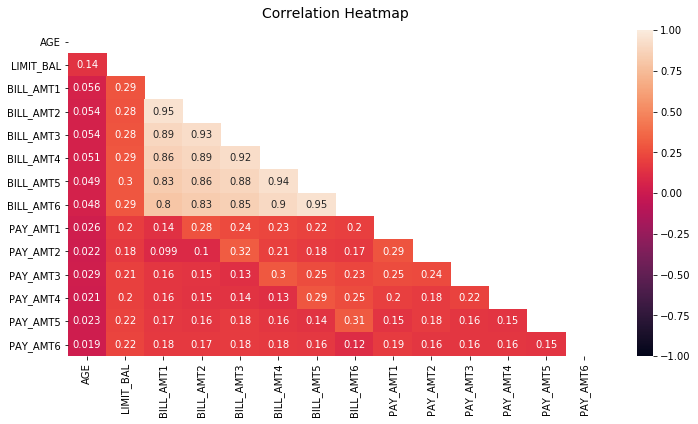

In [0]:
import seaborn as sns 

plt.figure(figsize=(12, 6))

mask = np.triu(np.ones_like(num_values.toPandas().corr(), dtype=np.bool))
heatmap=sns.heatmap(num_values.toPandas().corr(), mask=mask, vmin=-1, vmax=1,annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12);


For the time series variales (BILL_AMT1-BILL_AMT6 and PAY_AMT1-PAY_AMT6) the correlation seems to decrease with distance between months. In general, besides the billing amount variables, the level of correlation is acceptale.

In [0]:
bill_amt=data[["BILL_AMT1","BILL_AMT2", "BILL_AMT3","BILL_AMT4","BILL_AMT5","BILL_AMT6"]]
pmt_amt=data[["PAY_AMT1","PAY_AMT2", "PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6"]]

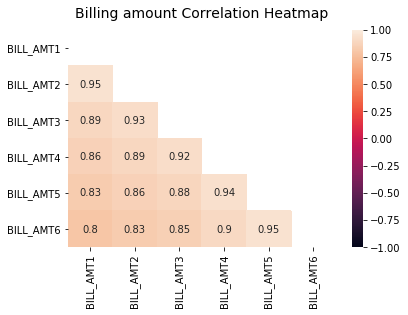

In [0]:
mask = np.triu(np.ones_like(bill_amt.toPandas().corr(), dtype=np.bool))
heatmap=sns.heatmap(bill_amt.toPandas().corr(), mask=mask, vmin=-1, vmax=1,annot=True)
heatmap.set_title('Billing amount Correlation Heatmap', fontdict={'fontsize':14}, pad=12);

Due to the very high correlations, I decided to apply PCA to the billing amount variables.

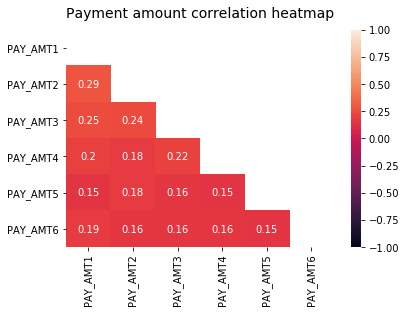

In [0]:
mask = np.triu(np.ones_like(pmt_amt.toPandas().corr(), dtype=np.bool))
heatmap=sns.heatmap(pmt_amt.toPandas().corr(), mask=mask, vmin=-1, vmax=1,annot=True)
heatmap.set_title('Payment amount correlation heatmap', fontdict={'fontsize':14}, pad=12);

In [0]:
data.groupBy('default_payment_next_month').count().orderBy('count', ascending=False).show()

+--------------------------+-----+
default_payment_next_month|count|
+--------------------------+-----+
 0|23364|
 1| 6636|
+--------------------------+-----+

In [0]:
import pyspark.sql.functions as f
from pyspark.sql.window import Window

data.groupBy('default_payment_next_month').count()\
.withColumn('percentage', f.round(f.col('count') / f.sum('count')\
.over(Window.partitionBy()),3)).show()

+--------------------------+-----+----------+
default_payment_next_month|count|percentage|
+--------------------------+-----+----------+
 1| 6636| 0.221|
 0|23364| 0.779|
+--------------------------+-----+----------+

There classes in the target variale seem well balanced. There does not seem to be any need for undersampling nor oversampling.

In [0]:
cat_values.groupBy('PAY_0').count().orderBy('count', ascending=False).show()

+-----+-----+
PAY_0|count|
+-----+-----+
 0|14737|
 -1| 5686|
 1| 3688|
 -2| 2759|
 2| 2667|
 3| 322|
 4| 76|
 5| 26|
 8| 19|
 6| 11|
 7| 9|
+-----+-----+

Because the repayment status is a strong indicator of the risk of default (like the DPD-Days Past Due), I will check the average re-payment status per default flag.

In [0]:
%sql
select default_payment_next_month,round(avg(PAY_0),4) as Avg_PAY_0,round(avg(PAY_2),4) as Avg_PAY_2,round(avg(PAY_3),4) as Avg_PAY_3,round(avg(PAY_4),4) as Avg_PAY_4,round(avg(PAY_5),4) as Avg_PAY_5,round(avg(PAY_6),4) as Avg_PAY_6 from `UCI_Credit_Card_csv` group by default_payment_next_month order by default_payment_next_month					

default_payment_next_month,Avg_PAY_0,Avg_PAY_2,Avg_PAY_3,Avg_PAY_4,Avg_PAY_5,Avg_PAY_6
0,-0.2112,-0.3019,-0.3163,-0.3556,-0.3895,-0.4056
1,0.6682,0.4583,0.3621,0.2545,0.1679,0.1121


Let us have a quick look at the distriutions of each of the variales.

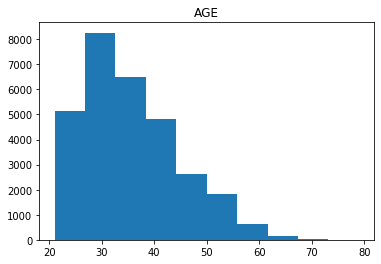

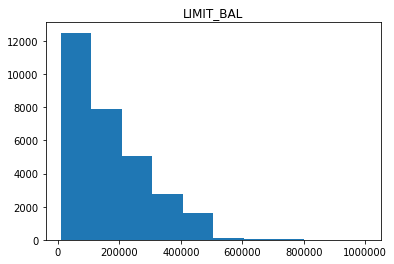

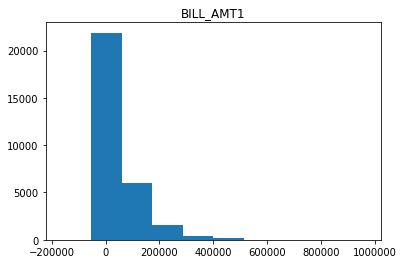

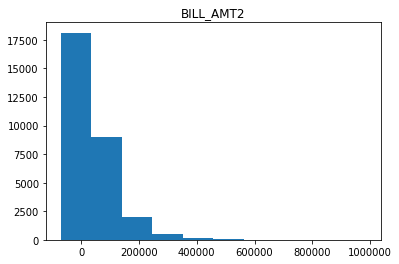

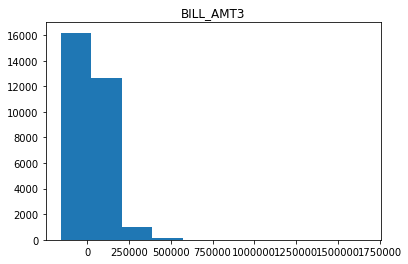

...

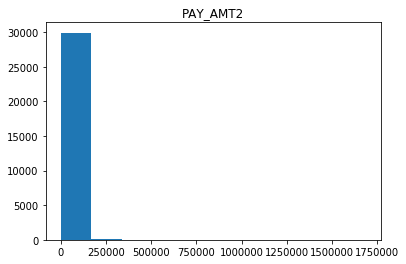

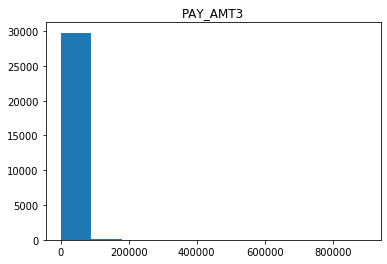

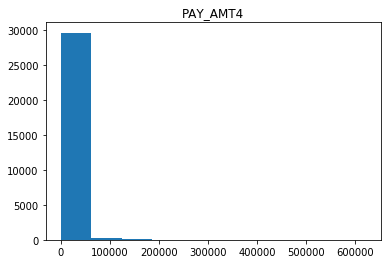

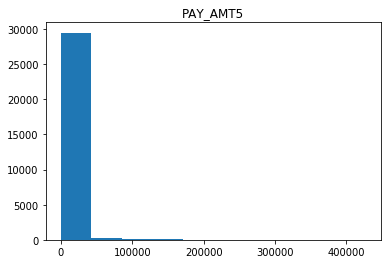

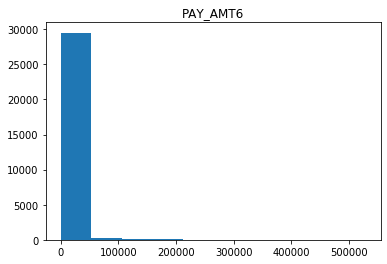

In [0]:
#distributions for all numeric variables 

for i in num_values.columns:
    plt.hist(num_values.toPandas()[i])
    plt.title(i)
    plt.show()

The numeric variables have similar distributions (right skewed).

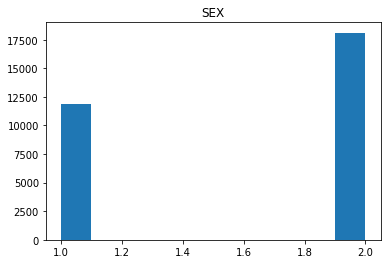

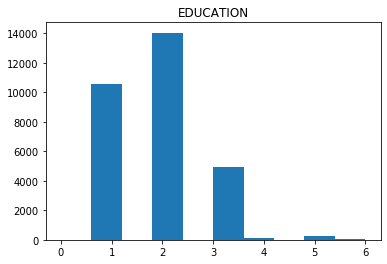

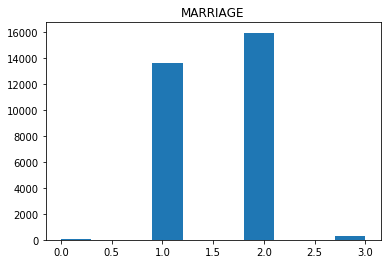

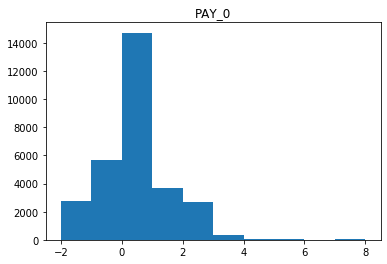

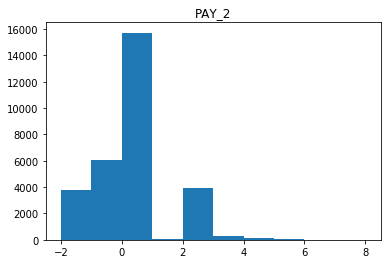

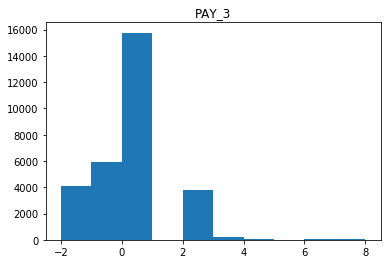

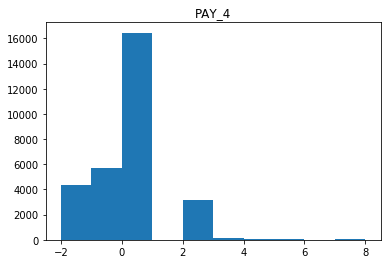

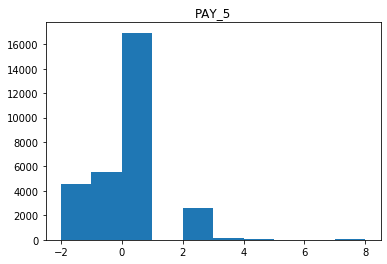

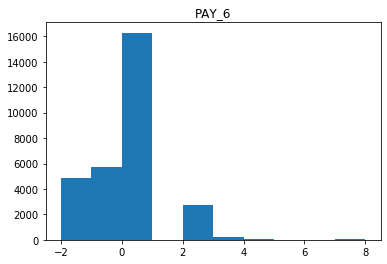

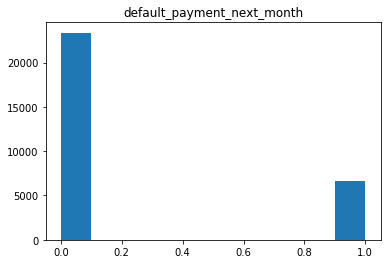

In [0]:
for i in cat_values.columns:
    plt.hist(cat_values.toPandas()[i])
    plt.title(i)
    plt.show()

In the next chapter I covered the feature engineering.

## Feature Engineering and Train-Test Split

First I will create the group values via clustering. Afterwards, I will encode the group variables using WOE encoding. In order to successfully create the clusters, I will follow the following steps:
* Detect and treat outliers
* One-hot-encoding, additional pre-processing and train-test split
* PCA applied to the billing amount variables
* Yeo-Johnson transformation applied to every numeric variable
* Feature scaling and assembling feature vector (final Machine Learning Pipelines)

### Univariate outlier detection and treatment

I used an [adjusted Tukey fence](https://www.researchgate.net/publication/265731183_A_generalized_boxplot_for_skewed_and_heavy-tailed_distributions) to account for the skewness in the distribution of each of the variables together with winsorizing.

In [0]:
# import numpy and statsmodels
import numpy as np
from statsmodels.stats.stattools import medcouple
import math

col_names=list(num_values.columns)

#rdd_num=num_values.rdd
data_after_winsorising=data.toPandas()

for i in col_names:
    q1, q2, q3 = data_after_winsorising[i].quantile([0.25,0.5,0.75])
    MC=medcouple(data_after_winsorising[i])
    IQR =q3-q1
    lower_cap=q1-1.5*math.exp(-3.5*MC)*IQR
    upper_cap=q3+1.5*math.exp(4*MC)*IQR
    data_after_winsorising[i]=data_after_winsorising[i].apply(lambda x: upper_cap if x>(upper_cap) else (lower_cap if x<(lower_cap) else x))
    #rdd_num2=rdd_num.map(lambda x: upper_cap if x[i]>(upper_cap) else (lower_cap if x[i]<(lower_cap) else x[i]))

data_after_winsorising = spark.createDataFrame(data_after_winsorising)    
#num_values_winsorized=rdd_num2.toDF(col_names)
#num_values_winsorized.show(10)    
#num_values_winsorized.describe() 

In [0]:
data_after_winsorising.write.option("header",True).csv(f"/mnt/{MOUNT_NAME}/data_after_winsorising.csv")

In [0]:
data_after_winsorising=(spark.read.option("sep",",").option("header",True).option("inferschema",True).csv(f"/mnt/{MOUNT_NAME}/data_after_winsorising.csv"))

In [0]:
display(data_after_winsorising)

ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month
15001,50000.0,2,1,2,22.0,0,0,0,-1,-1,-2,24763.0,33542.0,30455.0,2000.0,0.0,0.0,10000.0,1175.0,2000.0,0.0,0.0,0.0,1
15002,80000.0,2,1,2,24.0,-1,0,0,0,0,0,75356.0,78236.0,77700.0,58025.0,59527.0,60778.0,5000.0,4176.0,4000.0,3000.0,2141.0,3000.0,0
15003,90000.0,2,2,1,28.0,0,0,0,0,0,0,24657.0,25743.0,26406.0,24364.0,19726.0,19166.0,1500.0,1500.0,1508.0,1000.0,1000.0,800.0,0
15004,50000.0,2,2,1,27.0,-1,-1,-1,-1,-1,-1,492.0,492.0,492.0,492.0,492.0,470.0,493.0,493.0,493.0,493.0,471.0,7739.0,0
15005,270000.0,2,2,1,32.0,0,0,0,0,0,0,116315.0,119103.0,122249.0,123905.0,105064.0,105600.0,6500.0,6843.0,6284.0,3617.0,3716.0,4035.0,0
15006,60000.0,2,2,2,34.0,1,2,0,0,0,0,64684.0,63036.0,60031.0,27725.0,28282.0,30268.0,39.28260580711958,2459.0,1433.0,990.0,2419.0,0.0,0
15007,240000.0,2,2,1,35.0,-2,-2,-2,-2,-2,-2,3862.0,1780.0,0.0,0.0,0.0,0.0,1783.0,0.0,0.0,0.0,0.0,2500.0,0
15008,240000.0,1,1,2,36.0,0,0,0,0,0,0,131477.0,126941.0,62378.0,20156.0,157391.0,158991.0,6009.0,3017.0,1048.0,37931.882517568636,5613.0,5809.0,0
15009,30000.0,1,3,1,43.0,1,3,2,2,2,2,22494.0,21845.0,21207.0,23491.0,22818.0,24321.0,39.28260580711958,0.0,2645.0,0.0,2029.0,1027.0,1
15010,50000.0,1,2,2,42.0,1,2,0,0,0,0,51047.0,47924.0,49053.0,50106.0,17756.0,18072.0,39.28260580711958,2200.0,2180.0,1000.0,1000.0,800.0,0


In [0]:
col_names=list(num_values.columns)
data_after_winsorising[col_names].toPandas().describe()

Out[26]:

,AGE,LIMIT_BAL,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,35.485499,167478.915475,51227.775094,49180.326849,46989.540743,43264.742461,40288.121339,38873.576388,4886.718593,4834.943761,4057.584074,3834.599149,3805.520812,3849.777542
std,9.217901,129716.341956,73554.518088,71087.912653,68783.341803,64172.342951,60443.577258,59117.395012,8509.568941,8735.461817,6740.156895,6898.861122,6778.282496,6976.022770
min,21.000000,10000.000000,-12479.634070,-12022.962231,-11339.054412,-11695.043515,-12923.713408,-13746.172323,39.282606,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,50000.000000,3558.750000,2984.750000,2666.250000,2326.750000,1763.000000,1256.000000,1000.000000,833.000000,390.000000,296.000000,252.500000,117.750000
50%,34.000000,140000.000000,22381.500000,21200.000000,20088.500000,19052.000000,18104.500000,17071.000000,2100.000000,2009.000000,1800.000000,1500.000000,1500.000000,1500.000000
75%,41.000000,240000.000000,67091.000000,64006.250000,60164.750000,54506.000000,50190.500000,49198.250000,5006.000000,5000.000000,4505.000000,4013.250000,4031.500000,4000.000000
max,78.980814,837784.260826,797508.347492,786798.906964,748789.000696,613051.120247,501653.132960,480421.030961,53843.401359,55234.149985,35577.668028,37931.882518,37432.286546,36603.119843


Overall, a significant decrease in the maximum values afferent to the continuous variables can be observed. The impact of winsorising on the mean and standard deviation is very small.

###  One-hot-encoding, additional pre-processing and train-test split

A simple 70%/30% train-test split was used in PCA, feature scaling and model development. First I joined the numerical and categorical variables.

In [0]:
categoricalColumns =["EDUCATION", "MARRIAGE"]

for column in categoricalColumns:
    data_after_winsorising = data_after_winsorising.withColumn(column, data_after_winsorising['`{}`'.format(column)].cast('string'))
data_after_winsorising = data_after_winsorising.withColumn("default_payment_next_month", data_after_winsorising['`{}`'.format("default_payment_next_month")].cast('string'))

data_after_winsorising.printSchema()

root
-- ID: integer (nullable = true)
-- LIMIT_BAL: double (nullable = true)
-- SEX: integer (nullable = true)
-- EDUCATION: string (nullable = true)
-- MARRIAGE: string (nullable = true)
-- AGE: double (nullable = true)
-- PAY_0: integer (nullable = true)
-- PAY_2: integer (nullable = true)
-- PAY_3: integer (nullable = true)
-- PAY_4: integer (nullable = true)
-- PAY_5: integer (nullable = true)
-- PAY_6: integer (nullable = true)
-- BILL_AMT1: double (nullable = true)
-- BILL_AMT2: double (nullable = true)
-- BILL_AMT3: double (nullable = true)
-- BILL_AMT4: double (nullable = true)
-- BILL_AMT5: double (nullable = true)
-- BILL_AMT6: double (nullable = true)
-- PAY_AMT1: double (nullable = true)
-- PAY_AMT2: double (nullable = true)
-- PAY_AMT3: double (nullable = true)
-- PAY_AMT4: double (nullable = true)
-- PAY_AMT5: double (nullable = true)
-- PAY_AMT6: double (nullable = true)
-- default_payment_next_month: string (nullable = true)

In [0]:
import pyspark
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler
 
from distutils.version import LooseVersion
 
stages = [] # stages in Pipeline
for categoricalCol in categoricalColumns:
    # Category Indexing with StringIndexer
    stringIndexer = StringIndexer(inputCol=categoricalCol, outputCol=categoricalCol + "Index")
    # Use OneHotEncoder to convert categorical variables into binary SparseVectors
    if LooseVersion(pyspark.__version__) < LooseVersion("3.0"):
        from pyspark.ml.feature import OneHotEncoderEstimator
        encoder = OneHotEncoderEstimator(inputCols=[stringIndexer.getOutputCol()], outputCols=[categoricalCol + "classVec"])
    else:
        from pyspark.ml.feature import OneHotEncoder
        encoder = OneHotEncoder(inputCols=[stringIndexer.getOutputCol()], outputCols=[categoricalCol + "classVec"])
    # Add stages.  These are not run here, but will run all at once later on.
    stages += [stringIndexer, encoder]

In [0]:
# Convert label into label indices using the StringIndexer
label_stringIdx = StringIndexer(inputCol="default_payment_next_month", outputCol="label")
stages += [label_stringIdx]

In [0]:
partialPipeline = Pipeline().setStages(stages)
preproc_pipeline = partialPipeline.fit(data_after_winsorising)
data_after_preproc = preproc_pipeline.transform(data_after_winsorising)
display(data_after_preproc)

ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label
15001,50000.0,2,1,2,22.0,0,0,0,-1,-1,-2,24763.0,33542.0,30455.0,2000.0,0.0,0.0,10000.0,1175.0,2000.0,0.0,0.0,0.0,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0
15002,80000.0,2,1,2,24.0,-1,0,0,0,0,0,75356.0,78236.0,77700.0,58025.0,59527.0,60778.0,5000.0,4176.0,4000.0,3000.0,2141.0,3000.0,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15003,90000.0,2,2,1,28.0,0,0,0,0,0,0,24657.0,25743.0,26406.0,24364.0,19726.0,19166.0,1500.0,1500.0,1508.0,1000.0,1000.0,800.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15004,50000.0,2,2,1,27.0,-1,-1,-1,-1,-1,-1,492.0,492.0,492.0,492.0,492.0,470.0,493.0,493.0,493.0,493.0,471.0,7739.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15005,270000.0,2,2,1,32.0,0,0,0,0,0,0,116315.0,119103.0,122249.0,123905.0,105064.0,105600.0,6500.0,6843.0,6284.0,3617.0,3716.0,4035.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15006,60000.0,2,2,2,34.0,1,2,0,0,0,0,64684.0,63036.0,60031.0,27725.0,28282.0,30268.0,39.28260580711958,2459.0,1433.0,990.0,2419.0,0.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15007,240000.0,2,2,1,35.0,-2,-2,-2,-2,-2,-2,3862.0,1780.0,0.0,0.0,0.0,0.0,1783.0,0.0,0.0,0.0,0.0,2500.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15008,240000.0,1,1,2,36.0,0,0,0,0,0,0,131477.0,126941.0,62378.0,20156.0,157391.0,158991.0,6009.0,3017.0,1048.0,37931.882517568636,5613.0,5809.0,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15009,30000.0,1,3,1,43.0,1,3,2,2,2,2,22494.0,21845.0,21207.0,23491.0,22818.0,24321.0,39.28260580711958,0.0,2645.0,0.0,2029.0,1027.0,1,2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",1.0
15010,50000.0,1,2,2,42.0,1,2,0,0,0,0,51047.0,47924.0,49053.0,50106.0,17756.0,18072.0,39.28260580711958,2200.0,2180.0,1000.0,1000.0,800.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0


In [0]:
### Randomly split data into training and test sets. set seed for reproducibility
(trainingData, testData) = data_after_preproc.randomSplit([0.7, 0.3], seed=31)
print(trainingData.count())
print(testData.count())

21042
8958

###  PCA applied to the billing amount variables

In [0]:
from pyspark.ml.feature import PCA
from pyspark.ml.linalg import Vectors
from pyspark.mllib.regression import LabeledPoint
from pyspark.mllib.util import MLUtils
import numpy as np
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import RobustScaler
from pyspark.ml.feature import MinMaxScaler
import pyspark.sql.functions as f
import pyspark.sql.types
import pandas as pd
from pyspark.sql import Row
from pyspark.ml.feature import VectorAssembler

In [0]:
PCA_assembler = VectorAssembler(inputCols=bill_amt.columns, outputCol = "BILL_amt_features")
trainingData_pca_output = PCA_assembler.transform(trainingData)
testData_pca_output = PCA_assembler.transform(testData)

In [0]:
centre = StandardScaler(inputCol="BILL_amt_features", outputCol="centred_BA_features", withStd=False, withMean=True)

# Compute summary statistics by fitting the StandardScaler
scalerModel = centre.fit(trainingData_pca_output)

# Centre each feature to have zero standard deviation.
trainingData_pca_output = scalerModel.transform(trainingData_pca_output)

testData_pca_output = scalerModel.transform(testData_pca_output)

In [0]:
pca = PCA(k=6, inputCol = centre.getOutputCol(), outputCol="PCA_features")

pca_model = pca.fit(trainingData_pca_output)
trainingData_pca_output = pca_model.transform(trainingData_pca_output)
testData_pca_output = pca_model.transform(testData_pca_output)

trainingData_pca_output[["PCA_features"]].show(5, truncate = False)
testData_pca_output[["PCA_features"]].show(5, truncate = False)

+---------------------------------------------------------------------------------------------------------------------+
PCA_features |
+---------------------------------------------------------------------------------------------------------------------+
[-58046.4673718357,-3214.662992106769,-960.3583956229904,-10579.445547661277,-269.71240355151485,-1771.6150286639268]|
[-172420.71258622996,16034.095406748413,-7811.62706921951,2906.9773546992874,977.6900607547486,6761.090151584733] |
[12114.178190109595,-18907.910520157013,-17079.224845282508,9041.147357268992,-873.9205966031166,10384.867984565024] |
[-80753.37967438462,27586.367284210508,2356.078814430057,-1824.820137650675,410.84956672081444,1179.2511439253176] |
[5827.830286126548,-6998.966194059045,-9674.200265272633,5107.210343787522,-456.00705449121165,7787.716490578461] |
+---------------------------------------------------------------------------------------------------------------------+
only showing top 5 rows

+-----------------------------------------------------------------------------------------------------------------------+
PCA_features |
+-----------------------------------------------------------------------------------------------------------------------+
[70323.71563574664,-27421.43607758845,-10095.945171966569,-13676.146670956394,2418.370186188756,-2387.169886851283] |
[52685.828778156254,660.7853842832592,-4199.326502271034,-77.98844453486436,626.2615558181265,964.1401160560199] |
[109014.35660016524,1113.1224113149365,-1350.167644695659,-61.63945224278177,470.51623593283557,-133.71803927247856] |
[-4660.466577547827,-27954.506157563555,-2006.5674235351798,-14010.211932481212,-2834.731441960117,-2641.2789615731053]|
[107683.43973664255,-1802.9084616830514,414.44418621991645,616.426562597786,132.2012035432722,-117.14231353198375] |
+-----------------------------------------------------------------------------------------------------------------------+
only showing top 5 rows

The factor loadings afferent to each billing amount variable along with the amount of explained variance per principal component are printed below.

In [0]:
pcs=np.round(pca_model.pc.toArray(),4)
df_pc = pd.DataFrame(pcs, columns = ['PC1','PC2','PC3','PC4','PC5','PC6'], index = bill_amt.columns)
df_pc

Out[36]:

,PC1,PC2,PC3,PC4,PC5,PC6
BILL_AMT1,-0.4493,-0.5526,0.4597,0.2956,-0.4403,-0.0093
BILL_AMT2,-0.4427,-0.3857,0.0047,-0.2585,0.7666,0.0253
BILL_AMT3,-0.4305,-0.0769,-0.6405,-0.4460,-0.4297,-0.1222
BILL_AMT4,-0.3983,0.2631,-0.3805,0.6607,0.1135,0.4218
BILL_AMT5,-0.3680,0.4563,0.1602,0.1643,0.0969,-0.7709
BILL_AMT6,-0.3503,0.5124,0.4559,-0.4283,-0.1069,0.4605


In [0]:
np.round(100.00*pca_model.explainedVariance.toArray(),4)

Out[37]: array([90.8923, 4.9915, 1.8214, 0.9903, 0.7476, 0.5569])

Because the first principal component accounts for more than 90% of the variability, I decided to drop the rest of the principal components.

In [0]:
from pyspark.ml.functions import vector_to_array

trainingData_after_pca=trainingData_pca_output.withColumn("BILL_AMT_PC1", vector_to_array("PCA_features")).select(trainingData.columns + [col("BILL_AMT_PC1")[0].alias("BILL_AMT_PC1")]).drop("BILL_AMT1","BILL_AMT2", "BILL_AMT3","BILL_AMT4","BILL_AMT5","BILL_AMT6")
testData_after_pca=testData_pca_output.withColumn("BILL_AMT_PC1", vector_to_array("PCA_features")).select(testData.columns + [col("BILL_AMT_PC1")[0].alias("BILL_AMT_PC1")]).drop("BILL_AMT1","BILL_AMT2", "BILL_AMT3","BILL_AMT4","BILL_AMT5","BILL_AMT6")

display(testData_after_pca)

ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label,BILL_AMT_PC1
15001,50000.0,2,1,2,22.0,0,0,0,-1,-1,-2,10000.0,1175.0,2000.0,0.0,0.0,0.0,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0,70323.71563574664
15003,90000.0,2,2,1,28.0,0,0,0,0,0,0,1500.0,1500.0,1508.0,1000.0,1000.0,800.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,52685.828778156254
15004,50000.0,2,2,1,27.0,-1,-1,-1,-1,-1,-1,493.0,493.0,493.0,493.0,471.0,7739.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,109014.35660016524
15006,60000.0,2,2,2,34.0,1,2,0,0,0,0,39.28260580711958,2459.0,1433.0,990.0,2419.0,0.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,-4660.466577547827
15007,240000.0,2,2,1,35.0,-2,-2,-2,-2,-2,-2,1783.0,0.0,0.0,0.0,0.0,2500.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,107683.43973664255
15008,240000.0,1,1,2,36.0,0,0,0,0,0,0,6009.0,3017.0,1048.0,37931.882517568636,5613.0,5809.0,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,-153564.88988111512
15009,30000.0,1,3,1,43.0,1,3,2,2,2,2,39.28260580711958,0.0,2645.0,0.0,2029.0,1027.0,1,2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",1.0,55025.55542379513
15015,410000.0,1,2,2,39.0,0,0,0,0,0,0,14000.0,13014.0,30000.0,12000.0,10000.0,9040.0,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,-624767.8492014126
15016,50000.0,1,1,1,47.0,0,0,0,0,0,0,2657.0,2743.0,2668.0,1712.0,1762.0,1894.0,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,-14917.527076960381
15019,50000.0,1,1,1,41.0,0,0,0,2,2,2,2000.0,4000.0,0.0,7000.0,0.0,2000.0,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,15574.380840779082


### Yeo-Johnson transformation applied to every numeric variable

Because the features are highly skewed, I tried to make it slightly more normal using a Yeo-Johnson transformation. This should improve the performance of the predictive models.

The Yeo-Johnson transformation is an extension of Box-Cox transformation that can handle both positive and negative values.

In [0]:
from sklearn.preprocessing import PowerTransformer

power = PowerTransformer(method='yeo-johnson', standardize=False)
num_var=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1"]
cat_var=["ID","SEX","EDUCATION","MARRIAGE","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"]
add_var=["default_payment_next_month","EDUCATIONIndex","EDUCATIONclassVec","MARRIAGEIndex","MARRIAGEclassVec","label"]

pt_model = power.fit(trainingData_after_pca[num_var].toPandas())
num_train_after_yj=pt_model.transform(trainingData_after_pca[num_var].toPandas())
num_test_after_yj=pt_model.transform(testData_after_pca[num_var].toPandas())

num_train_after_yj=pd.DataFrame(num_train_after_yj,columns=num_var).reset_index(drop=True, inplace=False)
num_test_after_yj=pd.DataFrame(num_test_after_yj,columns=num_var).reset_index(drop=True, inplace=False)


cat_train_after_yj=pd.DataFrame(trainingData_after_pca[cat_var].toPandas(),columns=cat_var).reset_index(drop=True, inplace=False)
cat_test_after_yj=pd.DataFrame(testData_after_pca[cat_var].toPandas(),columns=cat_var).reset_index(drop=True, inplace=False)

train_after_yj=spark.createDataFrame(pd.concat([cat_train_after_yj,num_train_after_yj],axis=1))
test_after_yj=spark.createDataFrame(pd.concat([cat_test_after_yj,num_test_after_yj],axis=1))

from pyspark.sql.functions import monotonically_increasing_id

train_after_yj = train_after_yj.withColumn("row_id", monotonically_increasing_id())
test_after_yj = test_after_yj.withColumn("row_id", monotonically_increasing_id())
train_add_cols = trainingData_after_pca[add_var].withColumn("row_id", monotonically_increasing_id())
test_add_cols = testData_after_pca[add_var].withColumn("row_id", monotonically_increasing_id())

train_data_final = train_after_yj.join(train_add_cols, ("row_id")).drop("row_id")
test_data_final = test_after_yj.join(test_add_cols, ("row_id")).drop("row_id")

display(test_data_final)

ID,SEX,EDUCATION,MARRIAGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,AGE,LIMIT_BAL,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_PC1,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label
15001,2,1,2,0,0,0,-1,-1,-2,1.5346769113733703,66.04214720599852,23.082002733862964,17.648275745846774,19.270934907519212,0.0,0.0,0.0,154814.4641435783,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0
15003,2,2,1,0,0,0,0,0,0,1.5765348942301607,78.12596840246216,14.91367654026831,18.911795507028092,17.858212183532522,14.592583375363548,14.555491113622615,13.06938809546957,113422.85703439827,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15004,2,2,1,-1,-1,-1,-1,-1,-1,1.5705217187551805,66.04214720599852,11.25246348145529,13.68697465280432,13.040587068531073,12.056297171094343,11.87789307814393,22.568169300134066,248269.88341089117,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15006,2,2,2,1,2,0,0,0,0,1.6069323335293024,69.58588064603723,5.2090374604040495,21.696242803864543,17.61205543476363,14.554024440792503,18.241995260985554,0.0,-2626.9153139252144,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15007,2,2,1,-2,-2,-2,-2,-2,-2,1.6112322482244346,103.13125407141159,15.549855280106465,0.0,0.0,0.0,0.0,17.34818743822006,245005.86660340798,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15008,1,1,2,0,0,0,0,0,0,1.615353593794284,103.13125407141159,20.614219262803772,22.94369033143756,16.160334212988122,34.92416817627701,22.396525342299864,21.139443168803894,-66060.68585859782,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15009,1,3,1,1,3,2,2,2,2,1.6400840532995968,57.00008482506833,5.2090374604040495,0.0,20.757057089924466,0.0,17.456870703364732,13.932607565510699,118858.76672081063,1,2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",1.0
15015,1,2,2,0,0,0,0,0,0,1.6267603899697338,119.87495473805787,24.83810771760401,33.78198331653945,38.25248321341574,26.87602449817786,25.666724167631518,23.373848905176892,-241109.7543631621,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0
15016,1,1,1,0,0,0,0,0,0,1.6516772700450415,66.04214720599852,17.094459664242176,22.355660307977494,20.80453807616916,16.76987160040289,16.84593749407548,16.222241788534667,-7685.534098305531,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0
15019,1,1,1,0,0,0,2,2,2,1.633664419868349,66.04214720599852,15.983476302898616,24.762664467191158,0.0,23.68451653527725,0.0,16.438639303762802,30512.124238220968,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0


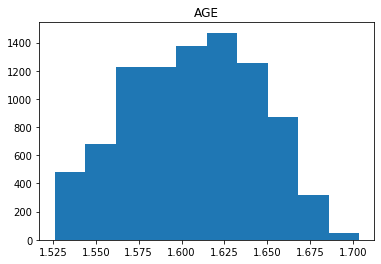

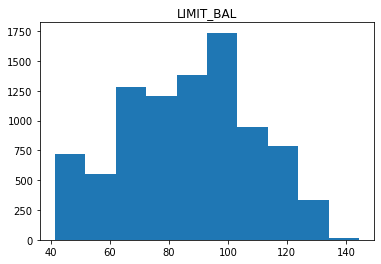

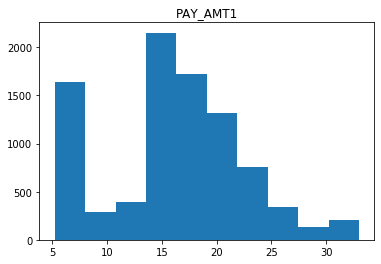

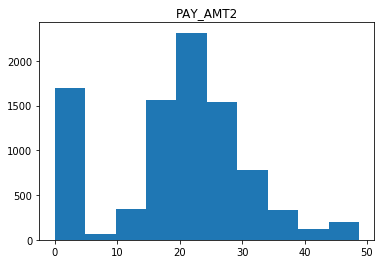

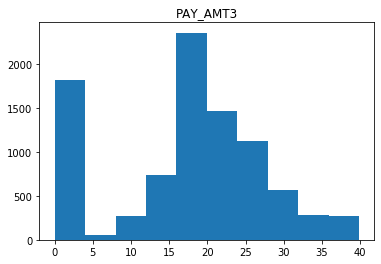

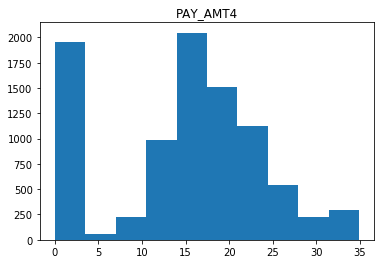

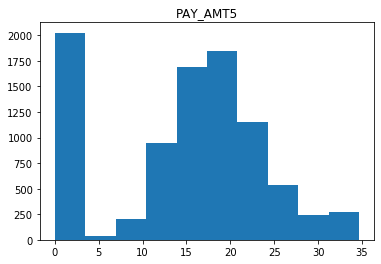

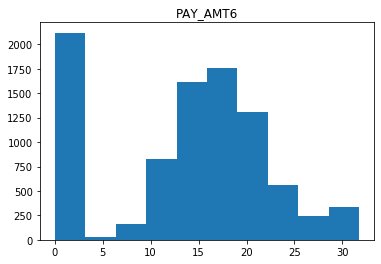

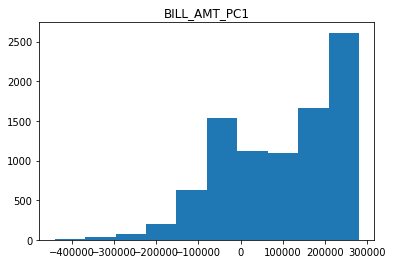

In [0]:
#distributions for all numeric variables 

for i in num_test_after_yj.columns:
    plt.hist(num_test_after_yj[i])
    plt.title(i)
    plt.show()

Even though still ar away from normally distributed, the numerical data looks less skewed than before.

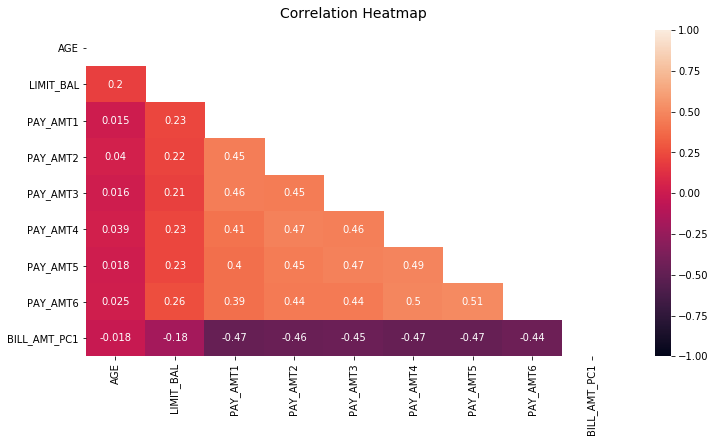

In [0]:
plt.figure(figsize=(12, 6))

mask = np.triu(np.ones_like(num_test_after_yj.corr(), dtype=np.bool))
heatmap=sns.heatmap(num_test_after_yj.corr(), mask=mask, vmin=-1, vmax=1,annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12);

The levels of correlation are now acceptable.

### Feature scaling and assembling feature vector (final Machine Learning Pipelines)

In [0]:
final_stages_std = [] # stages in Pipeline
final_stages_rs = []
final_stages_norm = []

# Feature scaling

num_feat_assembler = VectorAssembler(inputCols= num_var, outputCol = "num_features")
std = StandardScaler(inputCol="num_features", outputCol="std_num_features", withMean=True, withStd=True)
rs = RobustScaler(inputCol="num_features", outputCol="rs_num_features", withCentering=True, withScaling=True)
norm = MinMaxScaler(inputCol="num_features", outputCol="norm_num_features")

final_stages_std += [num_feat_assembler, std]
final_stages_rs += [num_feat_assembler, rs]
final_stages_norm += [num_feat_assembler, norm]

In [0]:
num_var=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1"]
categoricalColumns =["EDUCATION", "MARRIAGE"]

# Transform all features into a vector using VectorAssembler

std_assemblerInputs = ["std_num_features"] + [c + "classVec" for c in categoricalColumns] + ["SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"]
rs_assemblerInputs = ["rs_num_features"] + [c + "classVec" for c in categoricalColumns] + ["SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"]
norm_assemblerInputs = ["norm_num_features"] + [c + "classVec" for c in categoricalColumns] + ["SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"]

std_assembler = VectorAssembler(inputCols=std_assemblerInputs, outputCol="features")
rs_assembler = VectorAssembler(inputCols=rs_assemblerInputs, outputCol="features")
norm_assembler = VectorAssembler(inputCols=norm_assemblerInputs, outputCol="features")

final_stages_std += [std_assembler]
final_stages_rs += [rs_assembler]
final_stages_norm += [norm_assembler]

In [0]:
# Final data with standardisation

std_Pipeline = Pipeline().setStages(final_stages_std)
std_pipelineModel = std_Pipeline.fit(train_data_final)
std_train_data = std_pipelineModel.transform(train_data_final)
std_test_data = std_pipelineModel.transform(test_data_final)
display(std_test_data)

ID,SEX,EDUCATION,MARRIAGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,AGE,LIMIT_BAL,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_PC1,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label,num_features,std_num_features,features
15001,2,1,2,0,0,0,-1,-1,-2,1.5346769113733703,66.04214720599852,23.082002733862964,17.648275745846774,19.270934907519212,0.0,0.0,0.0,154814.4641435783,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5346769113733703, 66.04214720599852, 23.082002733862964, 17.648275745846774, 19.270934907519212, 0.0, 0.0, 0.0, 154814.4641435783))","Map(vectorType -> dense, length -> 9, values -> List(-1.9305163721081435, -0.9558782843515198, 1.0926821252420715, -0.16592373263412488, 0.20495536505401035, -1.575194613251377, -1.5550604499644654, -1.5107970047192958, 0.4385395225285313))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 15, 18, 22, 23, 24), values -> List(-1.9305163721081435, -0.9558782843515198, 1.0926821252420715, -0.16592373263412488, 0.20495536505401035, -1.575194613251377, -1.5550604499644654, -1.5107970047192958, 0.4385395225285313, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0))"
15003,2,2,1,0,0,0,0,0,0,1.5765348942301607,78.12596840246216,14.91367654026831,18.911795507028092,17.858212183532522,14.592583375363548,14.555491113622615,13.06938809546957,113422.85703439827,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5765348942301607, 78.12596840246216, 14.91367654026831, 18.911795507028092, 17.858212183532522, 14.592583375363548, 14.555491113622615, 13.06938809546957, 113422.85703439827))","Map(vectorType -> dense, length -> 9, values -> List(-0.8011175493134775, -0.40039806027920505, -0.14804993687746063, -0.05591880734432459, 0.07082206311866851, -0.010100979707790112, -0.003742391575447585, -0.04541783769438234, 0.1278134348340186))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 16, 18), values -> List(-0.8011175493134775, -0.40039806027920505, -0.14804993687746063, -0.05591880734432459, 0.07082206311866851, -0.010100979707790112, -0.003742391575447585, -0.04541783769438234, 0.1278134348340186, 1.0, 1.0, 2.0))"
15004,2,2,1,-1,-1,-1,-1,-1,-1,1.5705217187551805,66.04214720599852,11.25246348145529,13.68697465280432,13.040587068531073,12.056297171094343,11.87789307814393,22.568169300134066,248269.88341089117,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5705217187551805, 66.04214720599852, 11.25246348145529, 13.68697465280432, 13.040587068531073, 12.056297171094343, 11.87789307814393, 22.568169300134066, 248269.88341089117))","Map(vectorType -> dense, length -> 9, values -> List(-0.9633631435633355, -0.9558782843515198, -0.7041717567776247, -0.5108036816292452, -0.38659534313511784, -0.28212446513449363, -0.2891196525087772, 1.019614127671174, 1.1401077589631605))","Map(vectorType -> dense, length -> 25, values -> List(-0.9633631435633355, -0.9558782843515198, -0.7041717567776247, -0.5108036816292452, -0.38659534313511784, -0.28212446513449363, -0.2891196525087772, 1.019614127671174, 1.1401077589631605, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0))"
15006,2,2,2,1,2,0,0,0,0,1.6069323335293024,69.58588064603723,5.2090374604040495,21.696242803864543,17.61205543476363,14.554024440792503,18.241995260985554,0.0,-2626.9153139252144,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -

In [0]:
# Final data with robust scaling

rs_Pipeline = Pipeline().setStages(final_stages_rs)
rs_pipelineModel = rs_Pipeline.fit(train_data_final)
rs_train_data = rs_pipelineModel.transform(train_data_final)
rs_test_data = rs_pipelineModel.transform(test_data_final)
display(rs_test_data)

ID,SEX,EDUCATION,MARRIAGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,AGE,LIMIT_BAL,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_PC1,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label,num_features,rs_num_features,features
15001,2,1,2,0,0,0,-1,-1,-2,1.5346769113733703,66.04214720599852,23.082002733862964,17.648275745846774,19.270934907519212,0.0,0.0,0.0,154814.4641435783,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5346769113733703, 66.04214720599852, 23.082002733862964, 17.648275745846774, 19.270934907519212, 0.0, 0.0, 0.0, 154814.4641435783))","Map(vectorType -> dense, length -> 9, values -> List(-1.2647649590780596, -0.6073814442683441, 1.0944498104923943, -0.27507137774310825, 0.04603082112680493, -1.5653298404947462, -1.4949423980220136, -1.2485043699221618, 0.1171214137362538))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 15, 18, 22, 23, 24), values -> List(-1.2647649590780596, -0.6073814442683441, 1.0944498104923943, -0.27507137774310825, 0.04603082112680493, -1.5653298404947462, -1.4949423980220136, -1.2485043699221618, 0.1171214137362538, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0))"
15003,2,2,1,0,0,0,0,0,0,1.5765348942301607,78.12596840246216,14.91367654026831,18.911795507028092,17.858212183532522,14.592583375363548,14.555491113622615,13.06938809546957,113422.85703439827,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5765348942301607, 78.12596840246216, 14.91367654026831, 18.911795507028092, 17.858212183532522, 14.592583375363548, 14.555491113622615, 13.06938809546957, 113422.85703439827))","Map(vectorType -> dense, length -> 9, values -> List(-0.5320793225495039, -0.281576316624997, -0.19899501329654748, -0.15329920320520415, -0.07500727875473169, -0.15645902330366326, -0.14918712889722774, -0.1833736523438757, -0.057658077411715185))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 16, 18), values -> List(-0.5320793225495039, -0.281576316624997, -0.19899501329654748, -0.15329920320520415, -0.07500727875473169, -0.15645902330366326, -0.14918712889722774, -0.1833736523438757, -0.057658077411715185, 1.0, 1.0, 2.0))"
15004,2,2,1,-1,-1,-1,-1,-1,-1,1.5705217187551805,66.04214720599852,11.25246348145529,13.68697465280432,13.040587068531073,12.056297171094343,11.87789307814393,22.568169300134066,248269.88341089117,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5705217187551805, 66.04214720599852, 11.25246348145529, 13.68697465280432, 13.040587068531073, 12.056297171094343, 11.87789307814393, 22.568169300134066, 248269.88341089117))","Map(vectorType -> dense, length -> 9, values -> List(-0.6373344495229482, -0.6073814442683441, -0.7787437852571569, -0.6568432050773814, -0.4877678155257384, -0.4013299639262795, -0.39674948434885304, 0.590759273141028, 0.5117446662588256))","Map(vectorType -> dense, length -> 25, values -> List(-0.6373344495229482, -0.6073814442683441, -0.7787437852571569, -0.6568432050773814, -0.4877678155257384, -0.4013299639262795, -0.39674948434885304, 0.590759273141028, 0.5117446662588256, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0))"
15006,2,2,2,1,2,0,0,0,0,1.6069323335293024,69.58588064603723,5.2090374604040495,21.696242803864543,17.61205543476363,14.554024440792503,18.241995260985554,0.0,-2626.9153139252144,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> L

In [0]:
# Final data with mormalisation (Min-Max scaling)

norm_Pipeline = Pipeline().setStages(final_stages_norm)
norm_pipelineModel = norm_Pipeline.fit(train_data_final)
norm_train_data = norm_pipelineModel.transform(train_data_final)
norm_test_data = norm_pipelineModel.transform(test_data_final)
display(norm_test_data)

ID,SEX,EDUCATION,MARRIAGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,AGE,LIMIT_BAL,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_PC1,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label,num_features,norm_num_features,features
15001,2,1,2,0,0,0,-1,-1,-2,1.5346769113733703,66.04214720599852,23.082002733862964,17.648275745846774,19.270934907519212,0.0,0.0,0.0,154814.4641435783,1,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5346769113733703, 66.04214720599852, 23.082002733862964, 17.648275745846774, 19.270934907519212, 0.0, 0.0, 0.0, 154814.4641435783))","Map(vectorType -> dense, length -> 9, values -> List(0.04690793325898941, 0.23524684219707584, 0.6428778027399328, 0.36219673829707155, 0.4834594605439646, 0.0, 0.0, 0.0, 0.8069108015371536))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 8, 10, 15, 18, 22, 23, 24), values -> List(0.04690793325898941, 0.23524684219707584, 0.6428778027399328, 0.36219673829707155, 0.4834594605439646, 0.8069108015371536, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0))"
15003,2,2,1,0,0,0,0,0,0,1.5765348942301607,78.12596840246216,14.91367654026831,18.911795507028092,17.858212183532522,14.592583375363548,14.555491113622615,13.06938809546957,113422.85703439827,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5765348942301607, 78.12596840246216, 14.91367654026831, 18.911795507028092, 17.858212183532522, 14.592583375363548, 14.555491113622615, 13.06938809546957, 113422.85703439827))","Map(vectorType -> dense, length -> 9, values -> List(0.2744927595644097, 0.35028112617391266, 0.34906894030124297, 0.38812803849116934, 0.44801778792587527, 0.41783624742924796, 0.4197727901595624, 0.41162743628179355, 0.7570892877901966))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 16, 18), values -> List(0.2744927595644097, 0.35028112617391266, 0.34906894030124297, 0.38812803849116934, 0.44801778792587527, 0.41783624742924796, 0.4197727901595624, 0.41162743628179355, 0.7570892877901966, 1.0, 1.0, 2.0))"
15004,2,2,1,-1,-1,-1,-1,-1,-1,1.5705217187551805,66.04214720599852,11.25246348145529,13.68697465280432,13.040587068531073,12.056297171094343,11.87789307814393,22.568169300134066,248269.88341089117,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5705217187551805, 66.04214720599852, 11.25246348145529, 13.68697465280432, 13.040587068531073, 12.056297171094343, 11.87789307814393, 22.568169300134066, 248269.88341089117))","Map(vectorType -> dense, length -> 9, values -> List(0.24179869734216952, 0.23524684219707584, 0.21737772003642825, 0.2808986921890686, 0.32715564758971194, 0.3452135813297292, 0.34255225603229383, 0.7107966802063119, 0.919399559064073))","Map(vectorType -> dense, length -> 25, values -> List(0.24179869734216952, 0.23524684219707584, 0.21737772003642825, 0.2808986921890686, 0.32715564758971194, 0.3452135813297292, 0.34255225603229383, 0.7107966802063119, 0.919399559064073, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 2.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0))"
15006,2,2,2,1,2,0,0,0,0,1.6069323335293024,69.58588064603723,5.2090374604040495,21.696242803864543,17.61205543476363,14.554024440792503,18.241995260985554,0.0,-2626.9153139252144,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values

## Model Building (Baseline Test Performance)¶
Before going further, I wanted to see how various different models perform with default parameters. I tried to assess each of the model's perormance to get a baseline. With the baseline, we can see how much tuning improves each of the models. 

The baseline model performance (in terms of AUROC) can be found in the table below:

| Baseline Model | Training AUROC | Test AUROC |
| --- | --- | --- |
    |Baseline gaussian naive bayes with standardised numeric variables | 45.61% | 46.14%|
    |Baseline gaussian naive bayes with robust scaling | 45.61% | 46.14%|
    |Baseline logistic regression with standardised numeric variables | 64.28% |63.37% |
    |Baseline logistic regression with robust scaling | 64.27% |63.37% |
    |Baseline decision tree classifier with standardised numeric variables |39.74% | 41.51% |
    |Baseline decision tree classifier with robust scaling |39.73% | 41.37% |
    |Baseline random forest classifier with standardised numeric variables (with feature importance)| 65.40% | 65.02% |
    |Baseline random forest classifier with robust scaling (with feature importance)| 65.41% | 65.02% |
    |Baseline linear support vector classifier with standardised numeric variables| 55.27% | 54.90% |
    |Baseline linear support vector classifier with robust scaling| 55.73% | 53.98% |
    |Baseline gradient boosting classifier with standardised numeric variables (including Shapley values)| 70.08% | 65.19% |
    |Baseline gradient boosting classifier with robust scaling (including Shapley values)| 70.33% | 65.04% |
    |Baseline extreme gradient boosting classifier with standardised numeric variables (including Shapley values)| 92.13% | 58.36%  |
    |Baseline extreme gradient boosting classifier with robust scaling (including Shapley values)| 92.13% | 62.76%  |
    |Baseline multilayer perceptron classifier with min-max scaling (1 hidden layer, 18 neurons)| 65.49% | 64.68%  |
    |Baseline multilayer perceptron classifier with min-max scaling (2 hidden layers with 18, respectively 9 neurons)| 66.97% | 64.74%  |

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import LinearSVC
from pyspark.ml.classification import GBTClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
from pyspark.ml.classification import MultilayerPerceptronClassifier

import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
#!pip install shap
import shap

evaluator = BinaryClassificationEvaluator()

In [0]:
#!pip install tensorflow
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
import mlflow
import mlflow.keras
import mlflow.tensorflow
#!pip install hyperopt
from hyperopt import fmin, hp, tpe, STATUS_OK, SparkTrials

### Baseline Gaussian Naive Bayes with standardised numeric variables

In [0]:
gnb = NaiveBayes(modelType="gaussian",labelCol="label", featuresCol="features")
model = gnb.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.4560837372636941
AUROC on test data: 0.46140207004758316

### Baseline gaussian naive bayes with robust scaling

In [0]:
gnb = NaiveBayes(modelType="gaussian",labelCol="label", featuresCol="features")
model = gnb.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.4560832109700643
AUROC on test data: 0.4614106646028129

### Baseline logistic regression with standardised numeric variables

In [0]:
lr = LogisticRegression(labelCol="label", featuresCol="features", maxIter=10)
model = lr.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.642782343375016
AUROC on test data: 0.6337202188688705

### Baseline logistic regression with robust scaling

In [0]:
lr = LogisticRegression(labelCol="label", featuresCol="features", maxIter=10)
model = lr.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.6427383057555471
AUROC on test data: 0.6336556690447837

### Baseline decision tree classifier with standardised numeric variables

In [0]:
dt = DecisionTreeClassifier(labelCol="label", featuresCol="features")
model = dt.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.39742960822702195
AUROC on test data: 0.4150919954664265

### Baseline decision tree classifier with robust scaling

In [0]:
dt = DecisionTreeClassifier(labelCol="label", featuresCol="features")
model = dt.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.39726231263946776
AUROC on test data: 0.41372375677945405

### Baseline random forest classifier with standardised numeric variables (with feature importance)

AUROC on training data: 0.6539910951117848
AUROC on test data: 0.6502186462103196
toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
Out[65]:

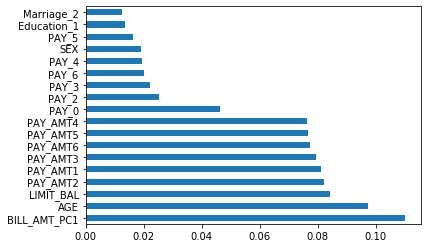

<matplotlib.axes._subplots.AxesSubplot at 0x7ff2d6ce7990>

In [0]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(labelCol="label", featuresCol="features",seed=31)
model = rf.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

# In order to plot the feature importance values, I first need to convert the feature vector to a Numpy array.
from sklearn.ensemble import RandomForestClassifier

std_train_data_pd = std_train_data.toPandas()

features = std_train_data_pd['features']
y_train = std_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,std_train_data_pd['features'].iloc[0:1])

series = std_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_std = np.apply_along_axis(lambda x : x[0], 1, series)

rf_skl = RandomForestClassifier()
rf_skl.fit(x_train_std, y_train.ravel())

feat_importances = pd.Series(rf_skl.feature_importances_, index=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])
feat_importances.nlargest(18).plot(kind='barh')

### Baseline random forest classifier with robust scaling (with feature importance)

AUROC on training data: 0.6541359837480526
AUROC on test data: 0.6502464243930447
toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
Out[66]:

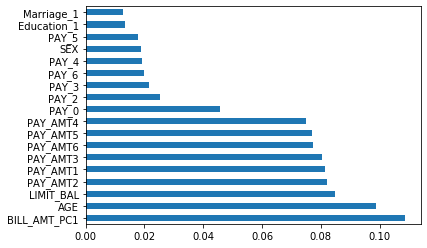

<matplotlib.axes._subplots.AxesSubplot at 0x7ff2d4391150>

In [0]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(labelCol="label", featuresCol="features",seed=31)
model = rf.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

# In order to plot the feature importance values, I first need to convert the feature vector to a Numpy array.
from sklearn.ensemble import RandomForestClassifier

rs_train_data_pd = rs_train_data.toPandas()

features = rs_train_data_pd['features']
y_train = rs_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,rs_train_data_pd['features'].iloc[0:1])

series = rs_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_std = np.apply_along_axis(lambda x : x[0], 1, series)

rf_skl = RandomForestClassifier()
rf_skl.fit(x_train_rs, y_train.ravel())

feat_importances = pd.Series(rf_skl.feature_importances_, index=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])
feat_importances.nlargest(18).plot(kind='barh')

### Baseline linear support vector classifier with standardised numeric variables

In [0]:
svc= LinearSVC(labelCol="label", featuresCol="features")
model = svc.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.5526816502463057
AUROC on test data: 0.5489592646367996

### Baseline linear support vector classifier with robust scaling

In [0]:
svc= LinearSVC(labelCol="label", featuresCol="features")
model = svc.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.5573096395941225
AUROC on test data: 0.539772627958966

### Baseline gradient boosting classifier with standardised numeric variables (including Shapley values)

AUROC on training data: 0.7008253402488316
AUROC on test data: 0.6519139494273163
toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
<IPython.core.display.HTML object>

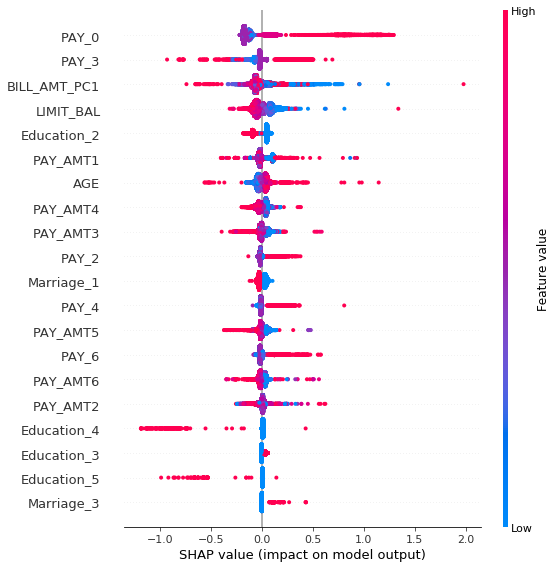

In [0]:
gbc= GBTClassifier(labelCol="label", featuresCol="features")
model = gbc.fit(std_train_data)
dev=model.transform(std_train_data)
preds=model.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

# In order to plot the Shapley values, I first need to convert the feature vector to Numpy array.
from sklearn.ensemble import GradientBoostingClassifier

std_train_data_pd = std_train_data.toPandas()

features = std_train_data_pd['features']
y_train = std_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,std_train_data_pd['features'].iloc[0:1])

series = std_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_std = np.apply_along_axis(lambda x : x[0], 1, series)

gbc_skl = GradientBoostingClassifier()
gbc_skl.fit(x_train_std, y_train.ravel())

shap.initjs()
explainer = shap.TreeExplainer(gbc_skl)
shap_values = explainer.shap_values(x_train_std)
shap.summary_plot(shap_values, features=x_train_std, feature_names=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])

### Baseline gradient boosting classifier with robust scaling (including Shapley values)

AUROC on training data: 0.7032859471706449
AUROC on test data: 0.6504872895231499
toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
<IPython.core.display.HTML object>

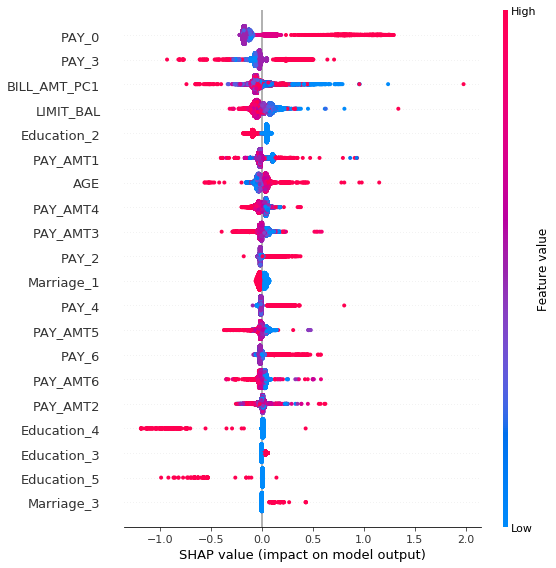

In [0]:
gbc= GBTClassifier(labelCol="label", featuresCol="features")
model = gbc.fit(rs_train_data)
dev=model.transform(rs_train_data)
preds=model.transform(rs_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

# In order to plot the Shapley values, I first need to convert the feature vector to Numpy array.
from sklearn.ensemble import GradientBoostingClassifier

rs_train_data_pd = rs_train_data.toPandas()

features = rs_train_data_pd['features']
y_train = rs_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,rs_train_data_pd['features'].iloc[0:1])

series = rs_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_rs = np.apply_along_axis(lambda x : x[0], 1, series)

gbc_skl = GradientBoostingClassifier()
gbc_skl.fit(x_train_rs, y_train.ravel())

shap.initjs()
explainer = shap.TreeExplainer(gbc_skl)
shap_values = explainer.shap_values(x_train_rs)
shap.summary_plot(shap_values, features=x_train_rs, feature_names=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])

### Baseline extreme gradient boosting classifier with standardised numeric variables (including Shapley values)

toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
[18:30:17] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUROC on training data: 0.9212636507410216
AUROC on test data: 0.5836293015295624
<IPython.core.display.HTML object>
ntree_limit is deprecated, use `iteration_range` or model slicing instead.

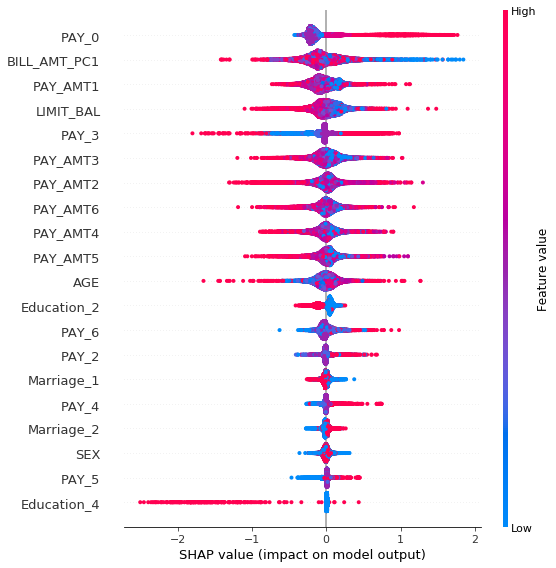

In [0]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

std_test_data_pd = std_test_data.toPandas()

features = std_test_data_pd['features']
y_test = std_test_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,std_test_data_pd['features'].iloc[0:1])

series = std_test_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_test_std = np.apply_along_axis(lambda x : x[0], 1, series)

xgb_skl = XGBClassifier()
xgb_skl.fit(x_train_std, y_train.ravel())

dev = xgb_skl.predict_proba(x_train_std)[:,1]
preds = xgb_skl.predict_proba(x_test_std)[:,1]

print('AUROC on training data: ', roc_auc_score(y_train, dev))
print('AUROC on test data: ', roc_auc_score(y_test, preds))


shap.initjs()
explainer = shap.TreeExplainer(xgb_skl)
shap_values = explainer.shap_values(x_train_std)
shap.summary_plot(shap_values, features=x_train_std, feature_names=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])

### Baseline extreme gradient boosting classifier with robust scaling (including Shapley values)

toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
[18:36:50] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
AUROC on training data: 0.9212636507410216
AUROC on test data: 0.6276372682833568
<IPython.core.display.HTML object>
ntree_limit is deprecated, use `iteration_range` or model slicing instead.

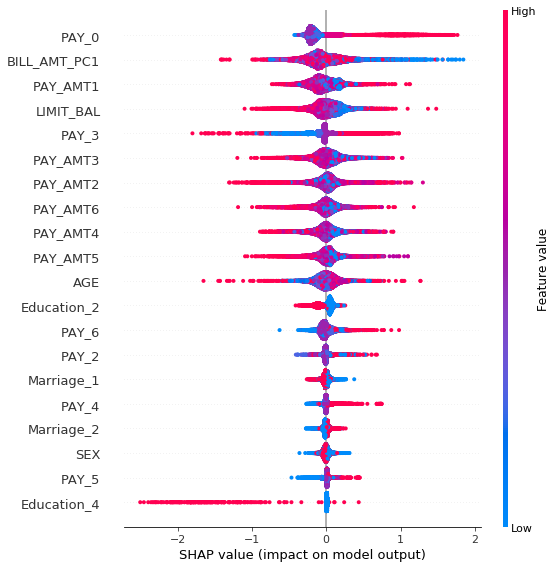

In [0]:
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

rs_test_data_pd = rs_test_data.toPandas()

features = rs_test_data_pd['features']
y_test = rs_test_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,rs_test_data_pd['features'].iloc[0:1])

series = rs_test_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_test = np.apply_along_axis(lambda x : x[0], 1, series)

xgb_skl = XGBClassifier()
xgb_skl.fit(x_train_rs, y_train.ravel())

dev = xgb_skl.predict_proba(x_train_rs)[:,1]
preds = xgb_skl.predict_proba(x_test_rs)[:,1]

print('AUROC on training data: ', roc_auc_score(y_train, dev))
print('AUROC on test data: ', roc_auc_score(y_test, preds))

shap.initjs()
explainer = shap.TreeExplainer(xgb_skl)
shap_values = explainer.shap_values(x_train_rs)
shap.summary_plot(shap_values, features=x_train_rs, feature_names=["AGE","LIMIT_BAL","PAY_AMT1","PAY_AMT2","PAY_AMT3","PAY_AMT4","PAY_AMT5","PAY_AMT6","BILL_AMT_PC1","Education_1","Education_2","Education_3","Education_4","Education_5","Education_6","Marriage_1","Marriage_2","Marriage_3","SEX","PAY_0","PAY_2","PAY_3","PAY_4","PAY_5","PAY_6"])

### Baseline multilayer perceptron classifier with min-max scaling (1 hidden layer, 18 neurons)

In [0]:
mpc= MultilayerPerceptronClassifier(labelCol="label", featuresCol="features",layers=[25,18,2], seed=31)
model = mpc.fit(norm_train_data)
dev=model.transform(norm_train_data)
preds=model.transform(norm_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.6549076486253207
AUROC on test data: 0.6467906153839348

### Baseline multilayer perceptron classifier with min-max scaling (2 hidden layers with 18, respectively 9 neurons)

In [0]:
mpc= MultilayerPerceptronClassifier(labelCol="label", featuresCol="features",layers=[25,18,9,2], seed=31)
model = mpc.fit(norm_train_data)
dev=model.transform(norm_train_data)
preds=model.transform(norm_test_data)


print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

AUROC on training data: 0.6697282285482715
AUROC on test data: 0.6473810286906561

## Hyperparameter Tuning (Tuned Model Performance)
After getting the baselines, let's see if we can improve on the indivdual model results! I mainly used grid search to tune four of the models (with AUROC>63% on test data). 

The tuned model performance (in terms of AUROC) can be found in the table below:

| Tuned Model |Training AUROC | Test AUROC |
| --- | --- | --- |
    | Tuned logistic regression with standardised numeric variables | 64.27% | 63.34%|
    | Tuned random forest classifier with robust scaling  | 68.96% | 63.33% |
    | Tuned gradient boosting classifier with standardised numeric variables| 70.08% | 65.19%  |
    | Tuned feed-forward neural networks with min-max scaling (2 hidden layers)| 67.14% | 65.61%  |

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

### Tuned logistic regression with standardised numeric variables

In [0]:
lr = LogisticRegression()

param_grid = (ParamGridBuilder()
             .addGrid(lr.regParam, np.logspace(-4, 4, 20))
             .addGrid(lr.elasticNetParam, [0.0,1.0])
             .addGrid(lr.maxIter, [20])
             .build())

# Create 5-fold CrossValidator
cv = CrossValidator(estimator=lr, estimatorParamMaps=param_grid, evaluator=evaluator, numFolds=5, seed=31)
 
# Run cross validations
cvModel = cv.fit(std_train_data)

dev=cvModel.transform(std_train_data)
preds=cvModel.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
AUROC on training data: 0.6427419700749444
AUROC on test data: 0.6334365985462943

### Tuned random forest classifier with robust scaling

In order to narrow down the potential number of configurations used in the grid search, I chose to first loop through several values of each of the individual hyperparameters to see which value leads to the highest accuracy. I chose accuracy instead of the AUROC because the latter is somewhat irresponsive to changes in the values of the hyperparameters.

In [0]:
#Create training data in Numpy array format

rs_train_data_pd = rs_train_data.toPandas()

features = rs_train_data_pd['features']
y_train = rs_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,rs_train_data_pd['features'].iloc[0:1])

series = rs_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_rs = np.apply_along_axis(lambda x : x[0], 1, series)


#Create test data in Numpy array format
rs_test_data_pd = rs_test_data.toPandas()

features = rs_test_data_pd['features']
y_test = rs_test_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,rs_test_data_pd['features'].iloc[0:1])

series = rs_test_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_test_rs = np.apply_along_axis(lambda x : x[0], 1, series)

/databricks/spark/python/pyspark/sql/pandas/conversion.py:93: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
 warnings.warn(msg)

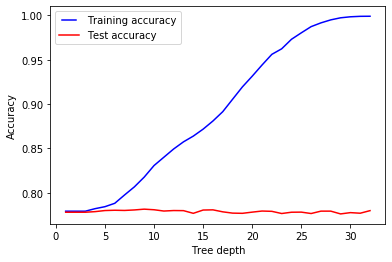

Out[68]:

,Tree depth,Training accuracy,Test accuracy
8,9.0,0.817697,0.781558
9,10.0,0.830733,0.780886
15,16.0,0.880971,0.780774
7,8.0,0.806708,0.780662
14,15.0,0.871789,0.780551


In [0]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from pandas import DataFrame

max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
val_results = []
for max_depth in max_depths:
    rf = RandomForestClassifier(random_state=31,n_jobs=-1,max_depth=max_depth).fit(x_train_rs, y_train.ravel())
    score_train=rf.score(x_train_rs, y_train)
    score_val=rf.score(x_test_rs, y_test)
    train_results.append(score_train)
    val_results.append(score_val)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Training accuracy")
line2, = plt.plot(max_depths, val_results, 'r', label="Test accuracy")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('Accuracy')
plt.xlabel('Tree depth')
plt.show()

max_depths=DataFrame(max_depths,columns=["Tree depth"])
train_results=DataFrame(train_results,columns=["Training accuracy"])
val_results=DataFrame(val_results,columns=["Test accuracy"])
features_grid=max_depths.join([train_results,val_results],on=None, how="left",sort=False)
features_grid_top5=features_grid.sort_values(by='Test accuracy', ascending=False).head(5)
features_grid_top5

In [0]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier()

param_grid = (ParamGridBuilder()
             .addGrid(rf.maxDepth, [8, 9, 10])
             .addGrid(rf.maxBins, [32,60])
             .addGrid(rf.numTrees, [5,10])
             .build())

# Create 5-fold CrossValidator
cv = CrossValidator(estimator=rf, estimatorParamMaps=param_grid, evaluator=evaluator, numFolds=5, seed=31)
 
# Run cross validations
cvModel = cv.fit(rs_train_data)

dev=cvModel.transform(rs_train_data)
preds=cvModel.transform(rs_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
AUROC on training data: 0.6896408769630754
AUROC on test data: 0.6530822649793486

###  Tuned gradient boosting classifier with standardised numeric variables

In order to narrow down the potential number of configurations used in the grid search, I chose to first loop through several values of each of the individual hyperparameters to see which value leads to the highest accuracy. I chose accuracy instead of the AUROC because the latter is somewhat irresponsive to changes in the values of the hyperparameters.

In [0]:
#Create training data in Numpy array format

std_train_data_pd = std_train_data.toPandas()

features = std_train_data_pd['features']
y_train = std_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,std_train_data_pd['features'].iloc[0:1])

series = std_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_std = np.apply_along_axis(lambda x : x[0], 1, series)


#Create test data in Numpy array format
std_test_data_pd = std_test_data.toPandas()

features = std_test_data_pd['features']
y_test = std_test_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,std_test_data_pd['features'].iloc[0:1])

series = std_test_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_test_std = np.apply_along_axis(lambda x : x[0], 1, series)

/databricks/spark/python/pyspark/sql/pandas/conversion.py:93: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
 warnings.warn(msg)

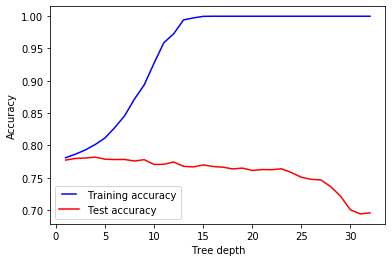

Out[71]:

,Tree depth,Training accuracy,Test accuracy
3,4.0,0.801427,0.782005
2,3.0,0.793102,0.780662
1,2.0,0.786632,0.779991
4,5.0,0.811513,0.778872
6,7.0,0.845718,0.778424


In [0]:
from sklearn.ensemble import GradientBoostingClassifier
import pandas as pd
from pandas import DataFrame

max_depths = np.linspace(1, 32, 32, endpoint=True)
train_results = []
val_results = []
for max_depth in max_depths:
    gbc = GradientBoostingClassifier(random_state=31,max_depth=max_depth).fit(x_train_std, y_train.ravel())
    score_train=gbc.score(x_train_std, y_train)
    score_val=gbc.score(x_test_std, y_test)
    train_results.append(score_train)
    val_results.append(score_val)
from matplotlib.legend_handler import HandlerLine2D
line1, = plt.plot(max_depths, train_results, 'b', label="Training accuracy")
line2, = plt.plot(max_depths, val_results, 'r', label="Test accuracy")
plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
plt.ylabel('Accuracy')
plt.xlabel('Tree depth')
plt.show()

max_depths=DataFrame(max_depths,columns=["Tree depth"])
train_results=DataFrame(train_results,columns=["Training accuracy"])
val_results=DataFrame(val_results,columns=["Test accuracy"])
features_grid=max_depths.join([train_results,val_results],on=None, how="left",sort=False)
features_grid_top5=features_grid.sort_values(by='Test accuracy', ascending=False).head(5)
features_grid_top5

In [0]:
from pyspark.ml.classification import GBTClassifier

gbc = GBTClassifier()

param_grid = (ParamGridBuilder()
             .addGrid(rf.maxDepth, [2, 3, 4])
             .addGrid(rf.maxBins, [32,60])
             .addGrid(rf.numTrees, [5,10])
             .build())

# Create 5-fold CrossValidator
cv = CrossValidator(estimator=gbc, estimatorParamMaps=param_grid, evaluator=evaluator, numFolds=5, seed=31)
 
# Run cross validations
cvModel = cv.fit(std_train_data)

dev=cvModel.transform(std_train_data)
preds=cvModel.transform(std_test_data)

print('AUROC on training data: ', evaluator.evaluate(dev))
print('AUROC on test data: ', evaluator.evaluate(preds))

MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
AUROC on training data: 0.7008262809986944
AUROC on test data: 0.6519140944831008

### Tuned feed-forward neural networks with min-max scaling (2 hidden layers)

In [0]:
#Create training data in Numpy array format

norm_train_data_pd = norm_train_data.toPandas()

features = norm_train_data_pd['features']
y_train = norm_train_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,norm_train_data_pd['features'].iloc[0:1])

series = norm_train_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_train_norm = np.apply_along_axis(lambda x : x[0], 1, series)


#Create test data in Numpy array format
norm_test_data_pd = norm_test_data.toPandas()

features = norm_test_data_pd['features']
y_test = norm_test_data_pd['label'].values.reshape(-1,1)

map(lambda x : x,norm_test_data_pd['features'].iloc[0:1])

series = norm_test_data_pd['features'].apply(lambda x : np.array(x.toArray())).to_numpy().reshape(-1,1)
x_test_norm = np.apply_along_axis(lambda x : x[0], 1, series)

toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
 Unable to convert the field EDUCATIONclassVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Context: Unsupported type in conversion to Arrow: VectorUDT
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.

In [0]:
from keras.models import Sequential
from keras.layers import Input,Dense
from keras.callbacks import EarlyStopping, ModelCheckpoint
import keras

In [0]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
 

checkpoint_path = "/FileStore/tables/keras_checkpoint_weights.ckpt"
 
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, verbose=1, save_best_only=True)
early_stopping = EarlyStopping(monitor="loss", mode="min", patience=3)
 

In [0]:
import keras
from sklearn.metrics import roc_auc_score
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adadelta,Adam,RMSprop
import hyperopt
from hyperopt import fmin, hp, tpe, STATUS_OK, SparkTrials

import sys

space = {   'units1': hp.quniform('units1', 0,38,1),
            'units2': hp.quniform('units2', 0,38,1),
            'activation_1':  hp.choice('activation_1',['relu', 'tanh', 'sigmoid','elu','selu','swish']),
            'activation_2':  hp.choice('activation_2',['relu', 'tanh', 'sigmoid','elu','selu','swish']),
            "learning_rate": hp.choice('learning_rate', [0.001,0.005,0.01]),
            'dropout1': hp.choice('dropout1', [0.10,0.25]),
            'dropout2': hp.choice('dropout2',  [0.10,0.25]),
            'optimizer': hp.choice('optimizer',['Adadelta','Adam','RMSprop'])        
        }

def f_nn(params):   
    print ('Params testing: ', params)
      # Log run information with mlflow.tensorflow.autolog()
        # Select optimizer
    tf.random.set_seed(31)
    optimizer_call = getattr(tf.keras.optimizers, params["optimizer"])
    optimizer = optimizer_call(learning_rate=params["learning_rate"])    
        
    model = Sequential()
    model.add(Dense(units=params['units1'],activation=params['activation_1'], input_dim = x_train_norm.shape[1])) 
    model.add(Dropout(params['dropout1']))

    model.add(Dense(units=params['units2'],activation=params['activation_2'])) 
    model.add(Dropout(params['dropout2'])) 
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=params['optimizer'])


    model.fit(x_train_norm, y_train, epochs=20,validation_split=.2, batch_size=32, callbacks=[model_checkpoint, early_stopping], verbose = 2)
    dev=model.predict(x_train_norm, batch_size = 32, verbose = 0)
    preds =model.predict(x_test_norm, batch_size = 32, verbose = 0)
    acc_train=roc_auc_score(y_train, dev)
    acc_test = roc_auc_score(y_test, preds)
    return {'loss': 1-acc_test, 'status': STATUS_OK}


spark_trials = SparkTrials()
best = fmin(f_nn, space, algo=tpe.suggest, max_evals=30, trials=spark_trials)
print(hyperopt.space_eval(space, best))

Because the requested parallelism was None or a non-positive value, parallelism will be set to (2), which is Spark's default parallelism (2), or 1, whichever is greater. We recommend setting parallelism explicitly to a positive value because the total of Spark task slots is subject to cluster sizing.
 0%| | 0/30 [00:00<?, ?trial/s, best loss=?] 3%|▎ | 1/30 [00:37<17:54, 37.06s/trial, best loss: 0.3477374452586668] 7%|▋ | 2/30 [00:39<07:40, 16.44s/trial, best loss: 0.3432642149773144] 10%|█ | 3/30 [02:05<21:42, 48.24s/trial, best loss: 0.3432642149773144] 13%|█▎ | 4/30 [02:08<13:10, 30.38s/trial, best loss: 0.3432642149773144] 17%|█▋ | 5/30 [02:35<12:09, 29.18s/trial, best loss: 0.3432642149773144] 20%|██ | 6/30 [02:41<08:31, 21.30s/trial, best loss: 0.3432642149773144] 23%|██▎ | 7/30 [03:09<09:00, 23.51s/trial, best loss: 0.3432642149773144] 27%|██▋ | 8/30 [03:30<08:19, 22.72s/trial, best loss: 0.3432642149773144] 30%|███ | 9/30 [03:56<08:18, 23.76s/trial, best loss: 0.3432642149773144] 33%|███▎ | 10/30 [04:00<05:53, 17.66s/trial, best loss: 0.3432642149773144] 37%|███▋ | 11/30 [04:39<07:39, 24.21s/trial, best loss: 0.3432642149773144] 40%|████ | 12/30 [04:53<06:19, 21.11s/trial, best loss: 0.3432642149773144] 43%|████▎ | 13/30 [05:10<05:37, 19.87s/trial, best loss: 0.3432642149773144] 47%|████▋ | 14/30 [05:40<06:07, 22.94s/trial, best loss: 0.3432642149773144] 50%|█████ | 15/30 [05:54<05:03, 20.26s/trial, best loss: 0.3432642149773144] 53%|█████▎ | 16/30 [06:16<04:51, 20.79s/trial, best loss: 0.3432642149773144] 57%|█████▋ | 17/30 [06:33<04:15, 19.66s/trial, best loss: 0.3432642149773144] 60%|██████ | 18/30 [07:00<04:22, 21.88s/trial, best loss: 0.3432642149773144] 63%|██████▎ | 19/30 [07:05<03:04, 16.82s/trial, best loss: 0.3432642149773144] 67%|██████▋ | 20/30 [07:29<03:09, 19.00s/trial, best loss: 0.3432642149773144] 70%|███████ | 21/30 [07:55<03:10, 21.13s/trial, best loss: 0.3432642149773144] 73%|███████▎ | 22/30 [08:06<02:24, 18.10s/trial, best loss: 0.3432642149773144] 77%|███████▋ | 23/30 [08:49<02:59, 25.60s/trial, best loss: 0.3432642149773144] 80%|████████ | 24/30 [08:56<01:58, 19.74s/trial, best loss: 0.3432642149773144] 83%|████████▎ | 25/30 [09:16<01:39, 19.84s/trial, best loss: 0.3432642149773144] 87%|████████▋ | 26/30 [09:31<01:13, 18.40s/trial, best loss: 0.3432642149773144] 90%|█████████ | 27/30 [09:54<00:59, 19.80s/trial, best loss: 0.3432642149773144] 93%|█████████▎| 28/30 [10:02<00:32, 16.29s/trial, best loss: 0.3432642149773144] 97%|█████████▋| 29/30 [10:31<00:20, 20.11s/trial, best loss: 0.3430515269333415]100%|██████████| 30/30 [10:36<00:00, 15.58s/trial, best loss: 0.3430515269333415]100%|██████████| 30/30 [10:36<00:00, 21.21s/trial, best loss: 0.3430515269333415]
Total Trials: 30: 30 succeeded, 0 failed, 0 cancelled.
{'activation_1': 'relu', 'activation_2': 'elu', 'dropout1': 0.1, 'dropout2': 0.1, 'learning_rate': 0.001, 'optimizer': 'RMSprop', 'units1': 32.0, 'units2': 6.0}

In [0]:
tf.random.set_seed(31)

def tuned_neural_network():
    model = Sequential()
    model.add(Dense(32,activation="relu",input_dim=x_train_norm.shape[1]))
    model.add(Dense(6, activation="elu"))
    model.add(Dense(1, activation="sigmoid"))
    return model

optimiser=tf.keras.optimizers.RMSprop(0.001)

tuned_neural_network=tuned_neural_network()

tuned_neural_network.compile(loss=tf.keras.losses.BinaryCrossentropy(),optimizer=optimiser,metrics= tf.keras.metrics.AUC())
tuned_neural_network.fit(x_train_norm, y_train,epochs=20,batch_size=32,callbacks=[model_checkpoint,early_stopping],validation_split=.2)

Epoch 1/20
 1/526 [..............................] - ETA: 5:07 - loss: 0.6970 - auc_1: 0.3333 37/526 [=>............................] - ETA: 0s - loss: 0.5618 - auc_1: 0.5766  65/526 [==>...........................] - ETA: 0s - loss: 0.5289 - auc_1: 0.6130 95/526 [====>.........................] - ETA: 0s - loss: 0.5229 - auc_1: 0.6297132/526 [======>.......................] - ETA: 0s - loss: 0.5178 - auc_1: 0.6377170/526 [========>.....................] - ETA: 0s - loss: 0.5069 - auc_1: 0.6507208/526 [==========>...................] - ETA: 0s - loss: 0.5039 - auc_1: 0.6501244/526 [============>.................] - ETA: 0s - loss: 0.5029 - auc_1: 0.6485282/526 [===============>..............] - ETA: 0s - loss: 0.5000 - auc_1: 0.6537319/526 [=================>............] - ETA: 0s - loss: 0.5033 - auc_1: 0.6563357/526 [===================>..........] - ETA: 0s - loss: 0.5032 - auc_1: 0.6580380/526 [====================>.........] - ETA: 0s - loss: 0.4997 - auc_1: 0.6610415/526 [======================>.......] - ETA: 0s - loss: 0.4962 - auc_1: 0.6658452/526 [========================>.....] - ETA: 0s - loss: 0.4943 - auc_1: 0.6675490/526 [==========================>...] - ETA: 0s - loss: 0.4942 - auc_1: 0.6676
Epoch 00001: val_loss improved from 0.56900 to 0.56852, saving model to /FileStore/tables/keras_checkpoint_weights.ckpt
INFO:tensorflow:Assets written to: /FileStore/tables/keras_checkpoint_weights.ckpt/assets
526/526 [==============================] - 2s 3ms/step - loss: 0.4918 - auc_1: 0.6695 - val_loss: 0.5685 - val_auc_1: 0.5050
Epoch 2/20
 1/526 [..............................] - ETA: 0s - loss: 0.6261 - auc_1: 0.6364 38/526 [=>............................] - ETA: 0s - loss: 0.4928 - auc_1: 0.6928 76/526 [===>..........................] - ETA: 0s - loss: 0.4826 - auc_1: 0.6870114/526 [=====>........................] - ETA: 0s - loss: 0.4797 - auc_1: 0.6886146/526 [=======>......................] - ETA: 0s - loss: 0.4829 - auc_1: 0.6879173/526 [========>.....................] - ETA: 0s - loss: 0.4764 - auc_1: 0.6892211/526 [===========>..................] - ETA: 0s - loss: 0.4775 - auc_1: 0.6824248/526 [=============>................] - ETA: 0s 

In [0]:
dev=tuned_neural_network.predict(x_train_norm, batch_size = 32, verbose = 0)
preds =tuned_neural_network.predict(x_test_norm, batch_size = 32, verbose = 0)

acc_train=roc_auc_score(y_train, dev)
acc_test = roc_auc_score(y_test, preds)
print('AUROC on training data: ', acc_train)
print('AUROC on test data: ', acc_test) 

AUROC on training data: 0.6713550811018484
AUROC on test data: 0.6561441387417963

## Conclusion
The model that performs the best with min-max scaling is the feed-forward neural network with 2 hidden layer after hyperparameter tuning. The tuned Gradient Boosting Classifier with standardised numeric variables is the second best performing algorithm. According to the Shapley values afferent to the baseline Gradient Boosting Classifier, the repayment status in September 2005 (PMT_0; the most recent time series) and the first principal component of the billing amount variables have the strongest impact on whether a client defaults. The effect of the repayment status variable sharply decreases with the distance in time (the earlier months affect the default proability to a lesser extent). The level of education plays an important role in reducing the default probability. So far, the influence each of the features has on the default probability is more or less as I initially expected.

Below, I created the final table that contains the default probability (PD) predictions and saved the final predictions in my S3 bucket in AWS.

In [0]:
final_predictions=pd.DataFrame(preds,columns=["PD"])
final_predictions=spark.createDataFrame(final_predictions)

from pyspark.sql.functions import monotonically_increasing_id

norm_train_data_v2 = norm_train_data.withColumn("row_id", monotonically_increasing_id())
final_predictions = final_predictions.withColumn("row_id", monotonically_increasing_id())

test_data_with_final_predictions = norm_train_data_v2.join(final_predictions, ("row_id")).drop("row_id")

display(test_data_with_final_predictions)

ID,SEX,EDUCATION,MARRIAGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,AGE,LIMIT_BAL,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,BILL_AMT_PC1,default_payment_next_month,EDUCATIONIndex,EDUCATIONclassVec,MARRIAGEIndex,MARRIAGEclassVec,label,num_features,norm_num_features,features,PD
15002,2,1,2,-1,0,0,0,0,0,1.5503252967645487,75.54740135887569,19.776609054146657,25.05085448481086,23.12763815472004,19.298929882759246,17.69396913861196,18.119344858972607,-26922.521337417493,0,1.0,"Map(vectorType -> sparse, length -> 6, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.5503252967645487, 75.54740135887569, 19.776609054146657, 25.05085448481086, 23.12763815472004, 19.298929882759246, 17.69396913861196, 18.119344858972607, -26922.521337417493))","Map(vectorType -> dense, length -> 9, values -> List(0.13198931626294552, 0.3257339561419656, 0.5239851515489174, 0.5141203546804463, 0.5802144794528992, 0.5525952625514059, 0.5102848633778435, 0.5706785518129964, 0.5881608579413701))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 15, 18, 19), values -> List(0.13198931626294552, 0.3257339561419656, 0.5239851515489174, 0.5141203546804463, 0.5802144794528992, 0.5525952625514059, 0.5102848633778435, 0.5706785518129964, 0.5881608579413701, 1.0, 1.0, 2.0, -1.0))",0.10306963
15005,2,2,1,0,0,0,0,0,0,1.597742679661123,106.6076342689904,20.980479480642884,28.56751015997872,25.97040190280509,20.205635725147985,20.2758630814625,19.429062483670446,-73510.42457529203,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.597742679661123, 106.6076342689904, 20.980479480642884, 28.56751015997872, 25.97040190280509, 20.205635725147985, 20.2758630814625, 19.429062483670446, -73510.42457529203))","Map(vectorType -> dense, length -> 9, values -> List(0.3898009955140829, 0.6214178788744926, 0.5672875114387322, 0.5862929132693177, 0.6515322974362334, 0.5785573939273692, 0.5847453412707604, 0.6119288157250715, 0.5320847588547778))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 16, 18), values -> List(0.3898009955140829, 0.6214178788744926, 0.5672875114387322, 0.5862929132693177, 0.6515322974362334, 0.5785573939273692, 0.5847453412707604, 0.6119288157250715, 0.5320847588547778, 1.0, 1.0, 2.0))",0.1491749
15010,1,2,2,1,2,0,0,0,0,1.6369312180431883,66.04214720599852,5.2090374604040495,21.041502705425515,19.719569322187745,14.592583375363548,14.555491113622615,13.06938809546957,23276.435870762172,0,0.0,"Map(vectorType -> sparse, length -> 6, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.6369312180431883, 66.04214720599852, 5.2090374604040495, 21.041502705425515, 19.719569322187745, 14.592583375363548, 14.555491113622615, 13.06938809546957, 23276.435870762172))","Map(vectorType -> dense, length -> 9, values -> List(0.6028718625780652, 0.23524684219707584, 0.0, 0.43183616113702444, 0.4947145736527986, 0.41783624742924796, 0.4197727901595624, 0.41162743628179355, 0.6485834462702863))","Map(vectorType -> sparse, length -> 25, indices -> List(0, 1, 3, 4, 5, 6, 7, 8, 9, 15, 18, 19, 20), values -> List(0.6028718625780652, 0.23524684219707584, 0.43183616113702444, 0.4947145736527986, 0.41783624742924796, 0.4197727901595624, 0.41162743628179355, 0.6485834462702863, 1.0, 1.0, 1.0, 1.0, 2.0))",0.18510684
15011,1,2,2,0,0,0,2,0,0,1.6024406700959273,116.47365424284193,19.0603913318806,26.96271927388595,23.842357508425696,19.180335736187196,19.521189073095062,18.180626202451066,-36509.67607569513,0,0.0,"Map(vectorType -> sparse, length -> 6, indices 

In [0]:
final_predictions=test_data_with_final_predictions[["ID","PD"]]
final_predictions.write.option("header",True).csv(f"/mnt/{MOUNT_NAME}/final_predictions.csv")